In [1]:
exp_name = 'dpl_002'

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [3]:
import torch
import torch.nn as nn
import torchvision
from torch.autograd import Variable
from torch.nn import functional as F

import numpy as np
from scipy import misc
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from multiprocessing import Process, Queue

In [4]:
import pickle
import csv
import os
import time
import datetime
import lmdb

In [5]:
def save_obj(obj, name ):
    with open( name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(name ):
    with open( name + '.pkl', 'rb') as f:
        return pickle.load(f)

now = datetime.datetime.now().strftime("%Y-%m-%d %H:%M")
logfile = open(f'../../log/{exp_name}.txt', 'a')
logfile.write(f'\n\n\n\n ----------------- {now} ----------------- \n\n')
logfile.flush()
def log(string, stdout=True):
    if stdout:
        print(string)
    logfile.write(string + '\n')
    logfile.flush()

In [6]:
with open('../../metadata/250_handpicked_labels.csv', 'r') as fin:
    all_labels = [item.strip() for item in fin]
    
label2idx = {}
for i, l in enumerate(all_labels):
    label2idx[l] = i
    

In [7]:
with open('../../../data/seedling/jpg.txt', 'r') as fin:
    test_img_filenames = [line.strip() for line in fin]
test_img_filenames = ['../../../data/seedling/' + item for item in test_img_filenames]

In [8]:
resnet = torchvision.models.resnet50() # resnet.eval() is very important, do not forget this line during testing!
print(resnet.fc)
resnet.fc = nn.Linear(2048, len(all_labels))
#saved_state_dict = torch.load(os.path.join('data/snapshots/','d2_rel_open_1600.pth'))
saved_state_dict = torch.load(os.path.join('../../snapshots', 'train_012', 'ckpt_4000'))
resnet.load_state_dict(saved_state_dict)
resnet.cuda(0)
resnet.eval()
resnet.float()

Linear(in_features=2048, out_features=1000, bias=True)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=F

In [9]:
finalconv_name = 'layer4'

# hook the feature extractor
features_blobs = []
def hook_feature(module, input, output):
    features_blobs.append(output.data.cpu().numpy())

resnet._modules.get(finalconv_name).register_forward_hook(hook_feature)

# get the softmax weight
params = list(resnet.parameters())
weight_softmax = np.squeeze(params[-2].cpu().data.numpy())

def returnCAM(feature_conv, weight_softmax, class_idx):
    # generate the class activation maps upsample to 256x256
    size_upsample = (256, 256)
    bz, nc, h, w = feature_conv.shape
    output_cam = []
    for idx in class_idx:
        cam = weight_softmax[idx].dot(feature_conv.reshape((nc, h*w)))
        cam = cam.reshape(h, w)
        cam = cam - np.min(cam)
        cam_img = cam / np.max(cam)
        cam_img = np.uint8(255 * cam_img)
        output_cam.append(cv2.resize(cam_img, size_upsample))
    return output_cam


In [10]:
def get_bbox(fid):
    bbox_threshold = [20, 100, 110]
    curParaThreshold = str(bbox_threshold[0]) + ' ' + str(bbox_threshold[1]) + ' ' + str(bbox_threshold[2])
    curHeatMapFile = f'../../CAM/bboxgenerator/heatmap_{fid}.jpg'
    # curImgFile = 'sample_6.jpg'
    curBBoxFile = f'../../CAM/bboxgenerator/heatmap_{fid}.txt'
    cmd = '../../CAM/bboxgenerator/./dt_box ' + curHeatMapFile + ' ' + curParaThreshold + ' ' + curBBoxFile
    if os.path.isfile(curBBoxFile):
        os.remove(curBBoxFile)
    os.system(cmd)
    lines = open(curBBoxFile).readlines()
    boxData = np.asarray(lines[0].split(),dtype= float)
    a = boxData[0::4]
    b = boxData[1::4]
    c = boxData[0::4] + boxData[2::4]
    d = boxData[1::4]+ boxData[3::4]
    boxData_formulate = np.vstack((a,b,c,d)).T
    a = np.minimum(boxData_formulate[:,0],boxData_formulate[:,2])
    b = np.minimum(boxData_formulate[:,1],boxData_formulate[:,3])
    c = np.maximum(boxData_formulate[:,0],boxData_formulate[:,2])
    d = np.maximum(boxData_formulate[:,1],boxData_formulate[:,3])
    boxData_formulate = np.vstack((a,b,c,d)).T
    return boxData_formulate

In [11]:
q_cam = Queue()
q_bbox = Queue()

In [12]:
def fn(pid):
    while(True):
        item = q_cam.get()    
        if item == 'DONE':
            q_bbox.put('DONE')
            return
        key, CAMs = item
        topk_box = []
        for iii in range(len(CAMs)):
            heat_resized = cv2.resize(CAMs[iii],(224, 224))
            cv2.imwrite(f'../../CAM/bboxgenerator/heatmap_{pid}.jpg', heat_resized)
            bbox = get_bbox(pid)
            bbox = bbox.astype('float32') / 224.0
            topk_box.append(bbox)

        q_bbox.put((key, topk_box))
            
    

In [13]:
proc = []
n_proc = 20
for i in range(n_proc):
    proc.append(Process(target=fn, args=(i,)))

In [14]:
for p in proc:
    p.start()

In [15]:
batch_size = 100
det_results = {}
batch = []
batch_keys = []
for i, filename in enumerate(test_img_filenames):
    try:
        with open(filename, 'rb') as fin:
            _ = fin.read(1024)
            imgbin = fin.read()
        imgbgr = cv2.imdecode(np.fromstring(imgbin, dtype='uint8'), cv2.IMREAD_COLOR)
        imgbgr = cv2.resize(imgbgr, (224, 224))
        imgrgb = imgbgr[:,:,[2,1,0]]        
        assert(imgrgb.shape[0] == 224 and imgrgb.shape[1] == 224 and imgrgb.shape[2] == 3)
    except Exception as ex:
        log(str(ex))
        continue
    
    imgrgb = imgrgb.astype(float)/255.0
    
    imgrgb[:,:,0] = (imgrgb[:,:,0] - 0.485)/0.229
    imgrgb[:,:,1] = (imgrgb[:,:,1] - 0.456)/0.224
    imgrgb[:,:,2] = (imgrgb[:,:,2] - 0.406)/0.225

    imgrgb = imgrgb.transpose((2,0,1))
    batch.append(imgrgb)
    imgid = filename.split('/')[-1]
    batch_keys.append(imgid)
    
    if len(batch) == batch_size or (i + 1) == len(test_img_filenames):
        batch = np.stack(batch)
    
        features_blobs = []
        
        with torch.no_grad():
            inp = torch.from_numpy(batch).float().cuda(0)
            outputs = resnet(inp)
            h_x = F.softmax(outputs).data.squeeze()
            probs, idx = h_x.sort(1, True)
            idx = np.asarray(idx)
            probs = np.asarray(probs)
        
        for ii in range(len(batch_keys)):            
            CAMs = returnCAM(features_blobs[0][ii:ii+1], weight_softmax, list(idx[ii]))
            q_cam.put((batch_keys[ii], CAMs))
            det_results[batch_keys[ii]] = {
                'sorted_labels': idx[ii],
                'sorted_probs': probs[ii],                
            }

        
        batch = []
        batch_keys = []
        log(f'processed {i + 1} out of {len(test_img_filenames)} images.')

/home/alireza/home_at_filer2/tools/anaconda3/envs/py3torch/lib/python3.6/site-packages/ipykernel/__main__.py:10: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
/home/alireza/home_at_filer2/tools/anaconda3/envs/py3torch/lib/python3.6/site-packages/ipykernel/__main__.py:37: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


processed 100 out of 3691 images.
processed 200 out of 3691 images.
processed 300 out of 3691 images.
processed 400 out of 3691 images.
processed 500 out of 3691 images.
processed 600 out of 3691 images.
processed 700 out of 3691 images.
processed 800 out of 3691 images.
processed 900 out of 3691 images.
processed 1000 out of 3691 images.
processed 1100 out of 3691 images.
processed 1200 out of 3691 images.
processed 1300 out of 3691 images.
processed 1400 out of 3691 images.
processed 1500 out of 3691 images.
processed 1600 out of 3691 images.
processed 1700 out of 3691 images.
processed 1800 out of 3691 images.
OpenCV(3.4.1) /io/opencv/modules/imgproc/src/resize.cpp:4044: error: (-215) ssize.width > 0 && ssize.height > 0 in function resize

processed 1901 out of 3691 images.
processed 2001 out of 3691 images.
processed 2101 out of 3691 images.
processed 2201 out of 3691 images.
processed 2301 out of 3691 images.
processed 2401 out of 3691 images.
processed 2501 out of 3691 images.
pr

In [16]:
for _ in range(n_proc):
    q_cam.put('DONE')

In [17]:
cnt = 0
n_done = 0
while(n_done < n_proc):
    item = q_bbox.get()
    if item == 'DONE':
        n_done += 1
        continue
    key, topk_bbox = item
    det_results[key]['sorted_bboxes'] = topk_bbox
    if cnt % 100 == 0:
        print(f'collected {cnt} out pf {len(test_img_filenames)} results from the queue')
    cnt += 1
for p in proc:
    p.join()        

collected 0 out pf 3691 results from the queue
collected 100 out pf 3691 results from the queue
collected 200 out pf 3691 results from the queue
collected 300 out pf 3691 results from the queue
collected 400 out pf 3691 results from the queue
collected 500 out pf 3691 results from the queue
collected 600 out pf 3691 results from the queue
collected 700 out pf 3691 results from the queue
collected 800 out pf 3691 results from the queue
collected 900 out pf 3691 results from the queue
collected 1000 out pf 3691 results from the queue
collected 1100 out pf 3691 results from the queue
collected 1200 out pf 3691 results from the queue
collected 1300 out pf 3691 results from the queue
collected 1400 out pf 3691 results from the queue
collected 1500 out pf 3691 results from the queue
collected 1600 out pf 3691 results from the queue
collected 1700 out pf 3691 results from the queue
collected 1800 out pf 3691 results from the queue
collected 1900 out pf 3691 results from the queue
collected 20

In [25]:
assert(cnt == len(img_subset))

AssertionError: 

In [18]:
save_obj(det_results, f'../../results/det_results_{exp_name}')

In [19]:
with open('../../data/OpenImages/metadata-v4/class-names/class-descriptions.csv', 'r') as fin:
    mids = list(csv.reader(fin))
name2mid = {}
mid2name = {}
for item in mids:
    mid2name[item[0]] = item[1]
    name2mid[item[1].lower().replace(' ', '')] = item[0]


IC0011TV3.jpg.ldcc


/home/alireza/home_at_filer2/tools/anaconda3/envs/py3torch/lib/python3.6/site-packages/ipykernel/__main__.py:9: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


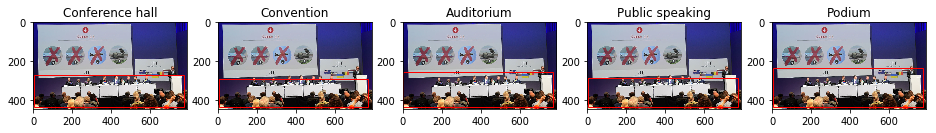

IC0011UAR.jpg.ldcc


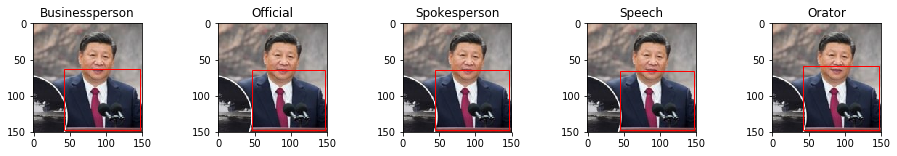

HC000SWJ2.jpg.ldcc


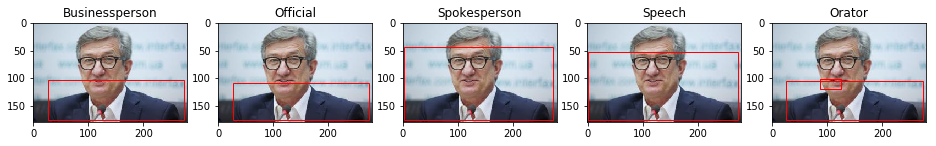

IC00120IV.jpg.ldcc


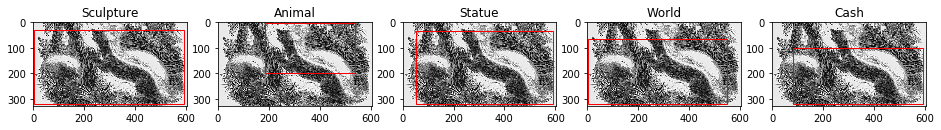

HC000SY3G.jpg.ldcc


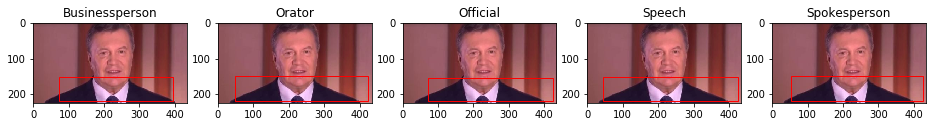

HC000SNJD.jpg.ldcc


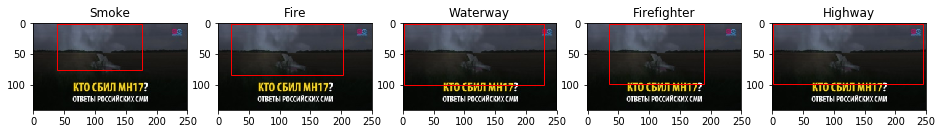

IC0011T2W.jpg.ldcc


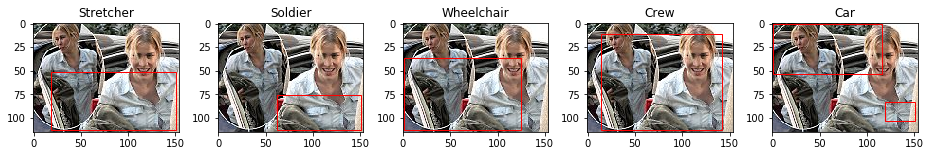

HC00025EX.jpg.ldcc


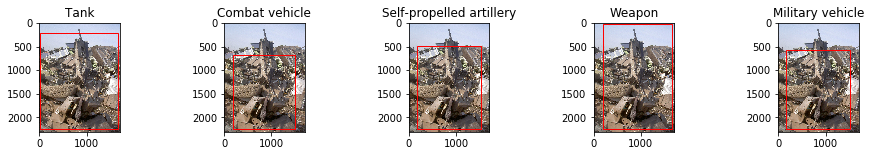

IC0011T59.jpg.ldcc


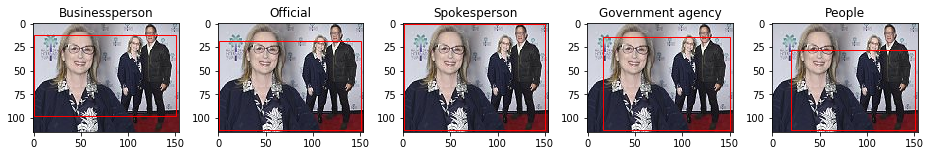

IC0011ULZ.jpg.ldcc


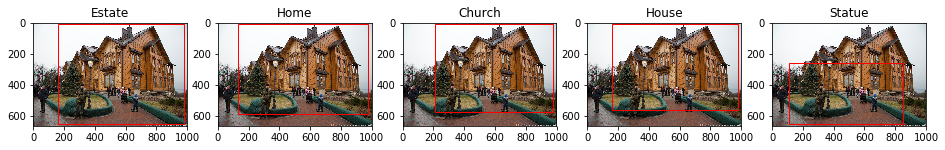

IC0011XGD.jpg.ldcc


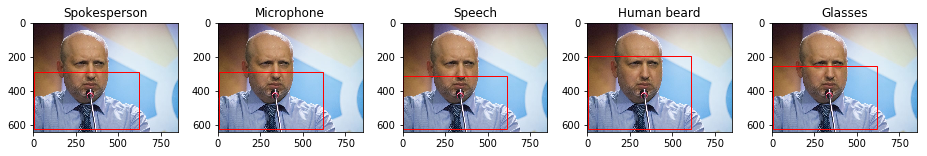

IC0011TU9.jpg.ldcc


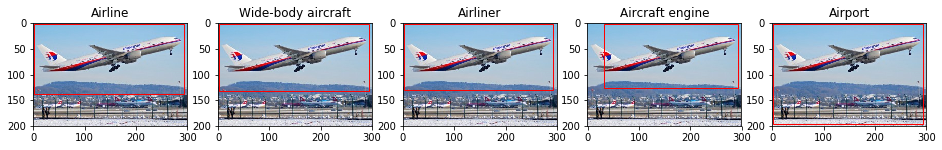

IC0011T1E.jpg.ldcc


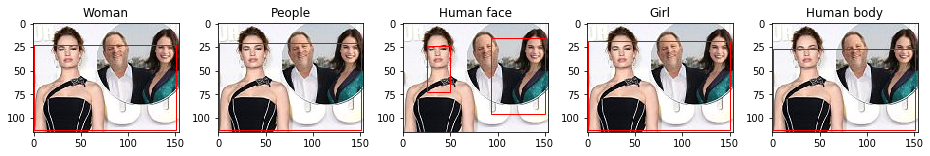

IC0011X6P.jpg.ldcc


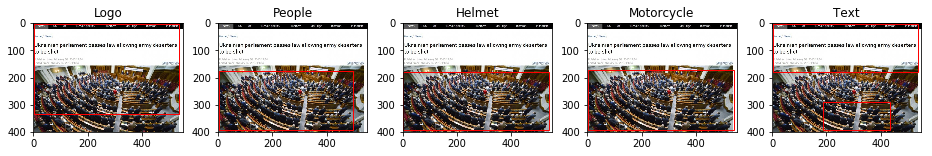

IC0011W8D.jpg.ldcc


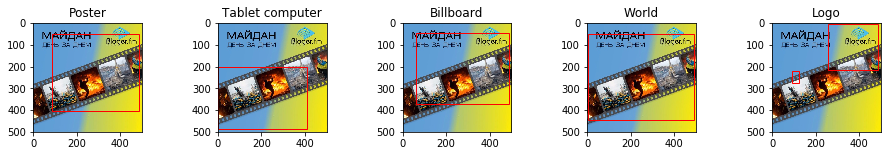

HC000ZN55.jpg.ldcc


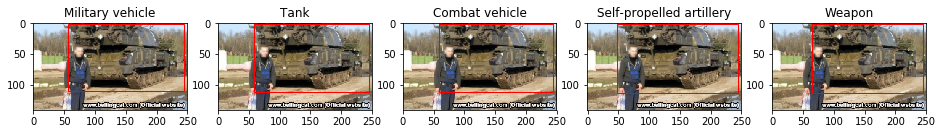

HC00025G1.jpg.ldcc


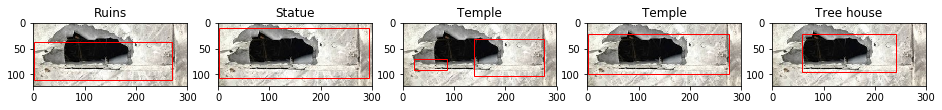

IC0011UOX.jpg.ldcc


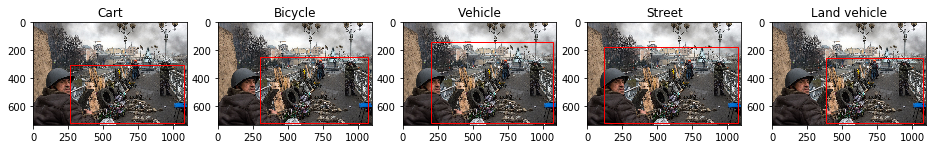

IC0011UG1.jpg.ldcc


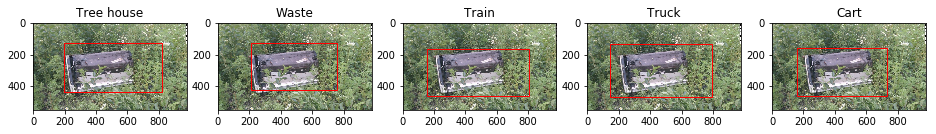

IC0011T5A.jpg.ldcc


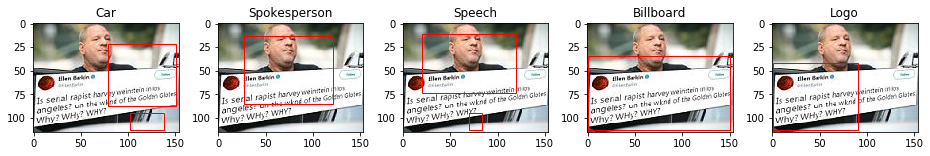

IC0011WGH.jpg.ldcc


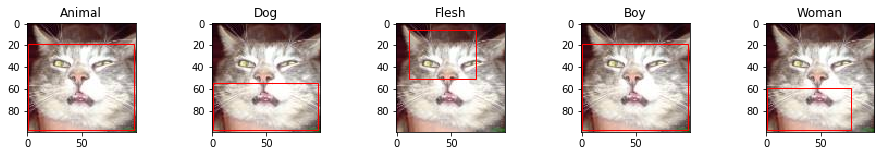

IC00120XC.jpg.ldcc


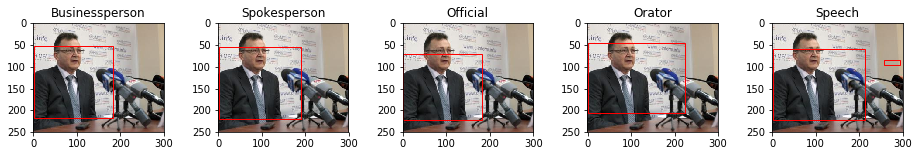

IC0011WJV.jpg.ldcc


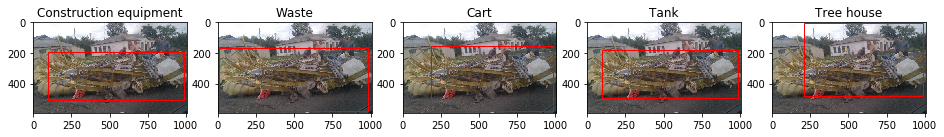

HC000SP4O.jpg.ldcc


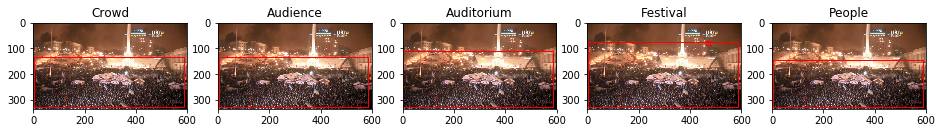

IC0011VV2.jpg.ldcc


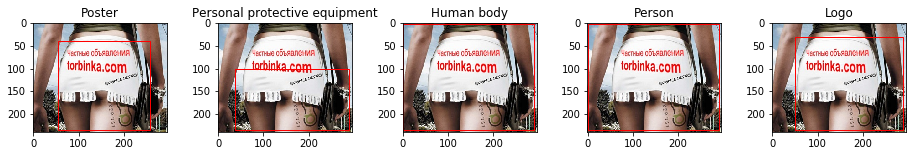

IC0011X0H.jpg.ldcc


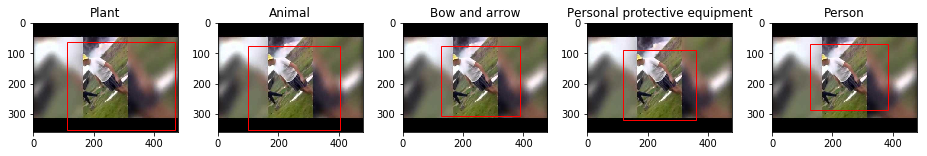

HC00025ES.jpg.ldcc


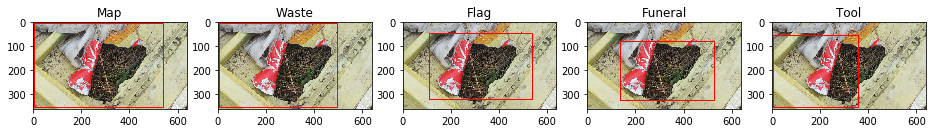

HC000SNLK.jpg.ldcc


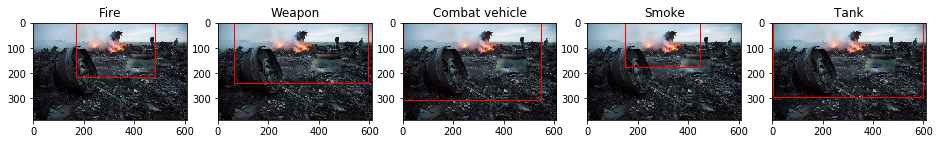

IC0011WML.jpg.ldcc


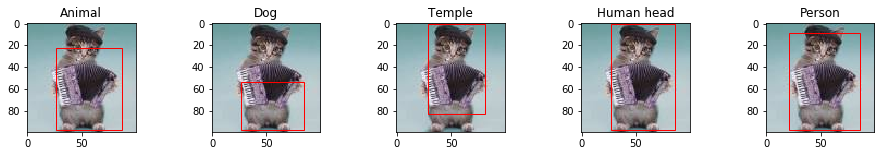

IC0011V0N.jpg.ldcc


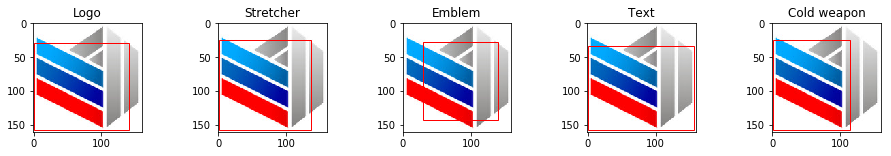

IC0011Y02.jpg.ldcc


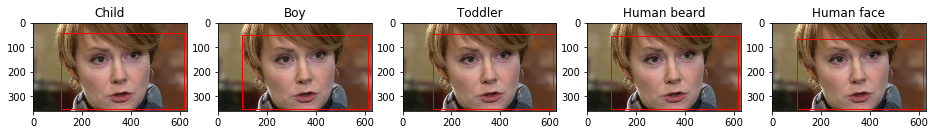

IC0011XM5.jpg.ldcc


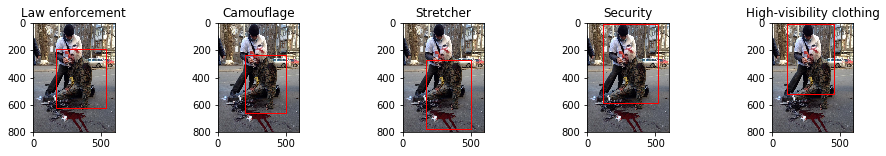

IC0011Z3N.jpg.ldcc


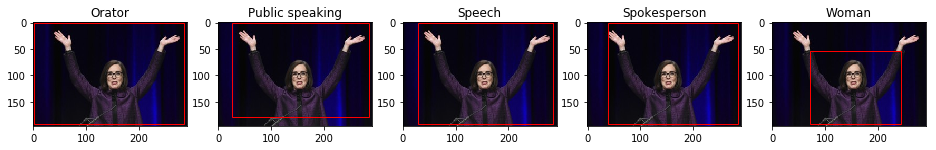

HC000SPOH.jpg.ldcc


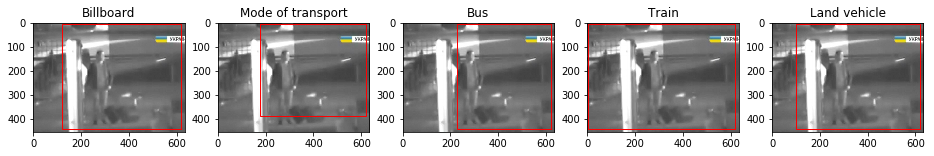

HC000ZJ5M.jpg.ldcc


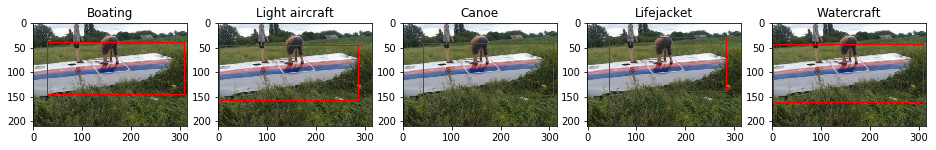

HC00025H0.jpg.ldcc


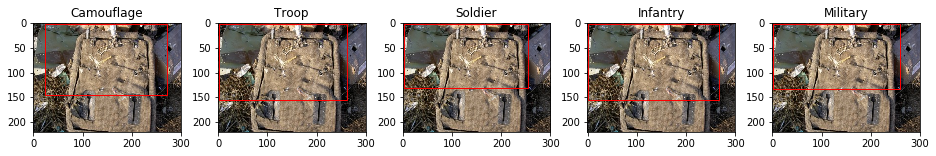

IC0011SIF.jpg.ldcc


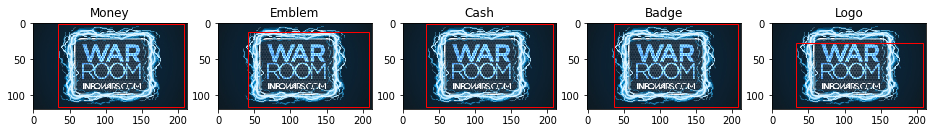

IC0011X1Y.jpg.ldcc


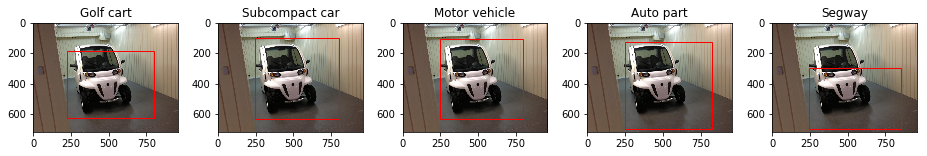

IC0011SSM.jpg.ldcc


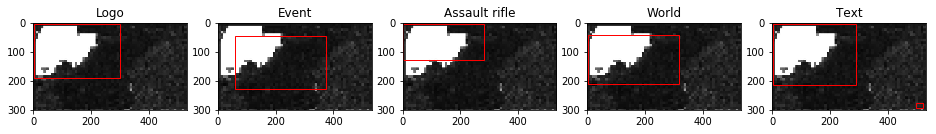

IC0011T2B.jpg.ldcc


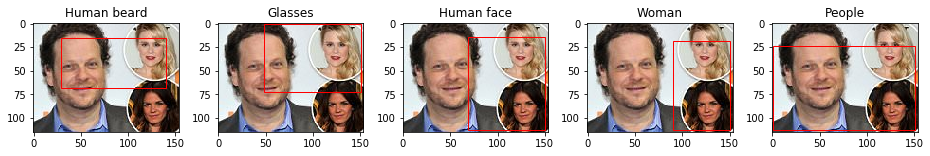

IC0011Y4F.jpg.ldcc


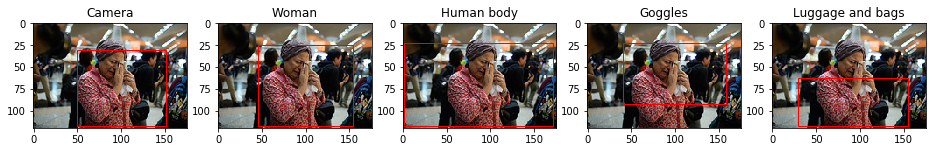

IC0011U5H.jpg.ldcc


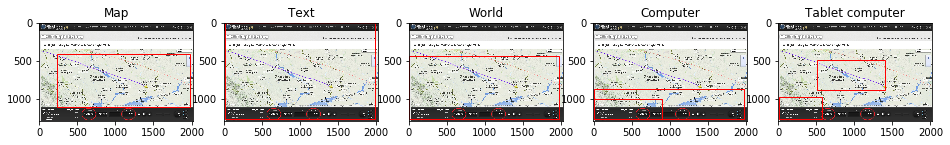

IC0011T8Q.jpg.ldcc


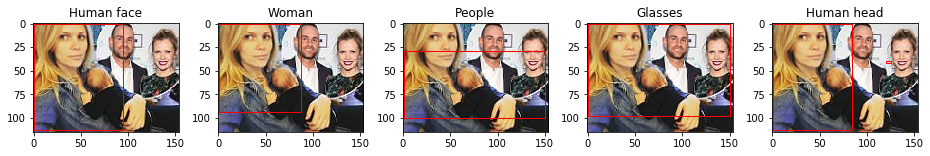

IC0011XQ9.jpg.ldcc


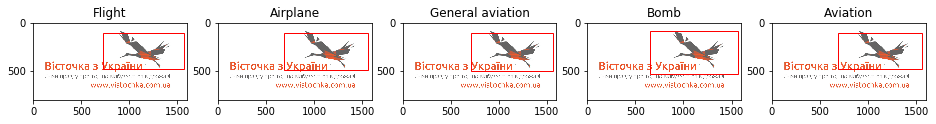

IC001210G.jpg.ldcc


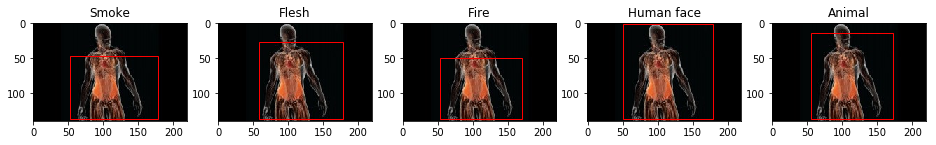

HC000ZJQ6.jpg.ldcc


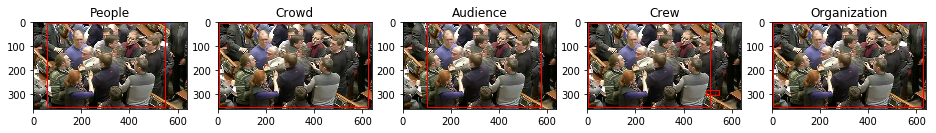

IC0011T8F.jpg.ldcc


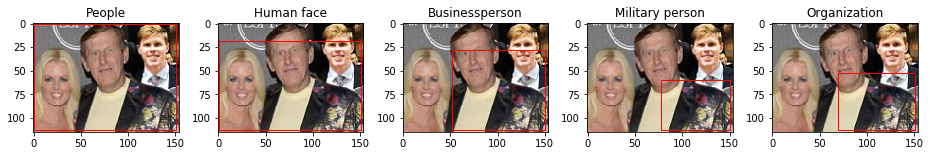

HC00025GJ.jpg.ldcc


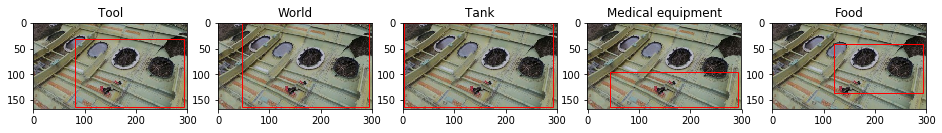

IC0011ZCX.jpg.ldcc


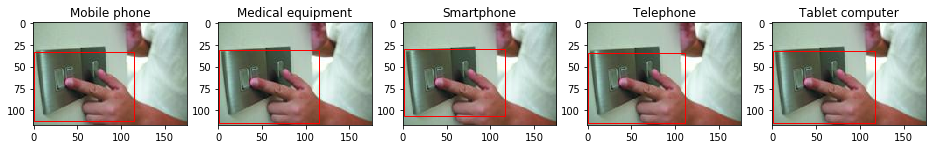

IC0011XS7.jpg.ldcc


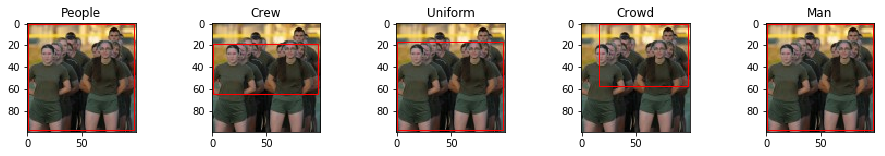

In [22]:
topk_vis = 5
for _ in range(50):
    filename = np.random.choice(test_img_filenames)
    imgid = filename.split('/')[-1]
    print(imgid)
    with open(filename, 'rb') as fin:
        _ = fin.read(1024)
        imgbin = fin.read()
    imgbgr = cv2.imdecode(np.fromstring(imgbin, dtype='uint8'), cv2.IMREAD_COLOR)
    imgrgb = imgbgr[:,:,[2,1,0]]        
    height, width, _ = imgrgb.shape

    #print([mid2name[item['label']] for item in annot[imgid]]) 
    
    fig, axes = plt.subplots(1, topk_vis, figsize=(16, 2))        
    
    for ii in range(topk_vis):
        axes[ii].imshow(imgrgb)
        axes[ii].set_title(mid2name[all_labels[det_results[imgid]['sorted_labels'][ii]]])
        for box in det_results[imgid]['sorted_bboxes'][ii][1::2]:
            axes[ii].add_patch(patches.Rectangle(
                (box[0]*width, box[1]*height), (box[2]-box[0])*width, (box[3]-box[1])*height,
                linewidth=1, edgecolor='r', facecolor='none'
            ))
            
    plt.show()

IC0011UPG.jpg.ldcc


/home/alireza/home_at_filer2/tools/anaconda3/envs/py3torch/lib/python3.6/site-packages/ipykernel/__main__.py:9: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


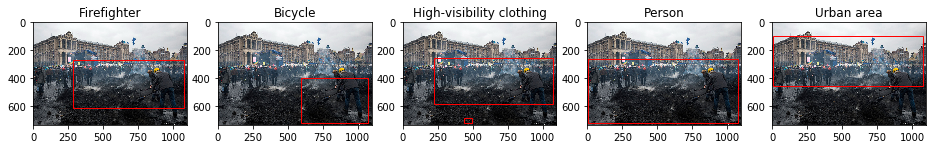

IC00158AG.jpg.ldcc


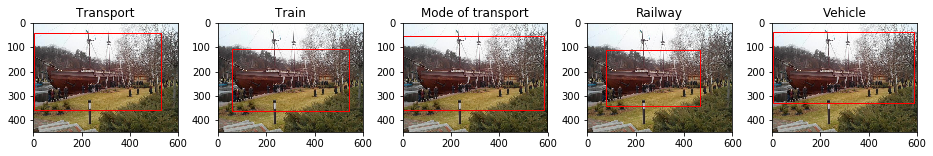

IC0011V7I.jpg.ldcc


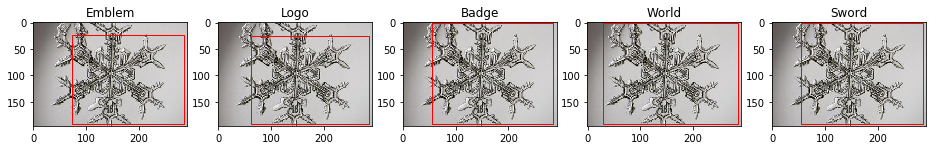

HC00000U5.jpg.ldcc


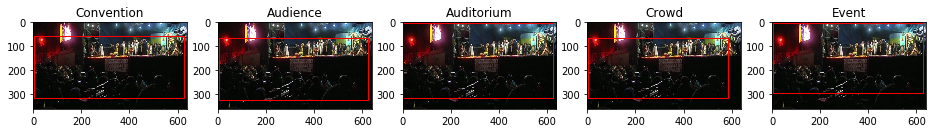

IC0011W1B.jpg.ldcc


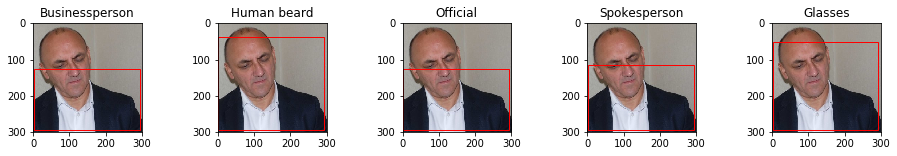

IC0011WFC.jpg.ldcc


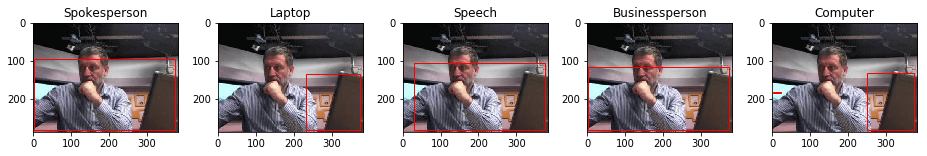

IC0011V0S.jpg.ldcc


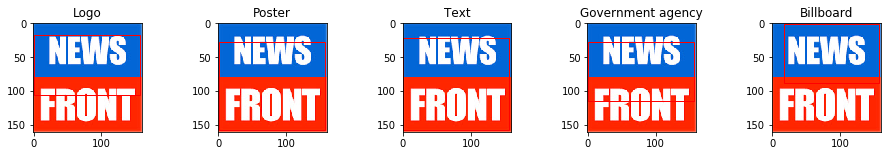

HC00000U5.jpg.ldcc


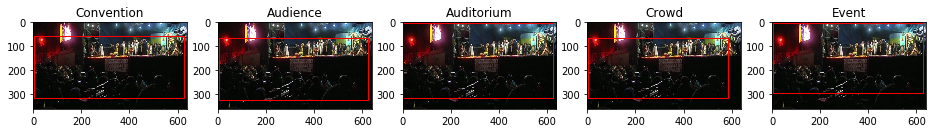

IC0011XSA.jpg.ldcc


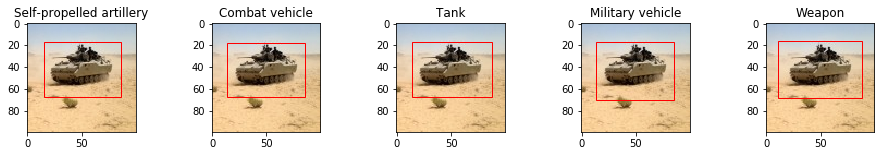

IC0011W08.jpg.ldcc


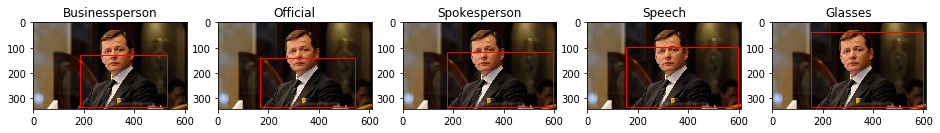

HC00000QX.jpg.ldcc


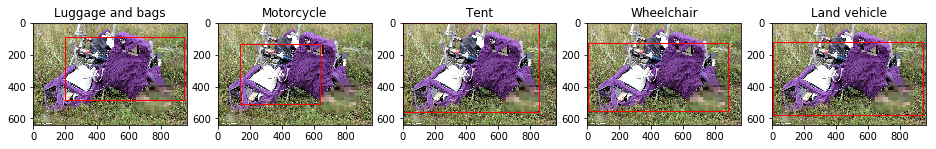

IC0011Z1A.jpg.ldcc


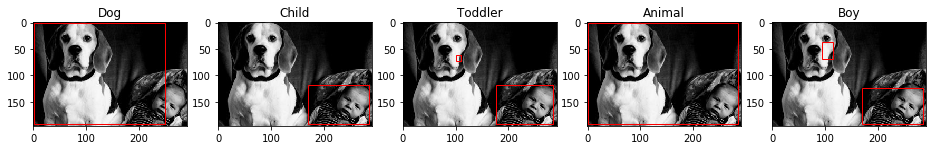

IC0011WEU.jpg.ldcc


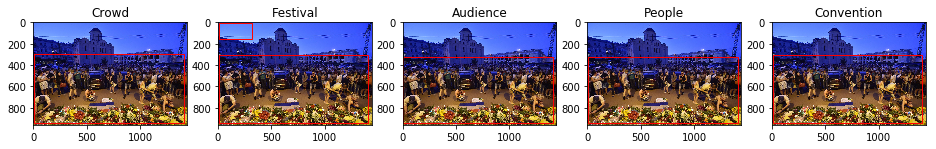

IC00120P9.jpg.ldcc


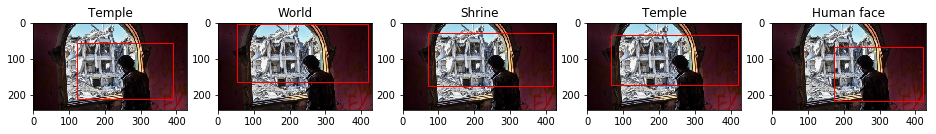

HC000SNNP.jpg.ldcc


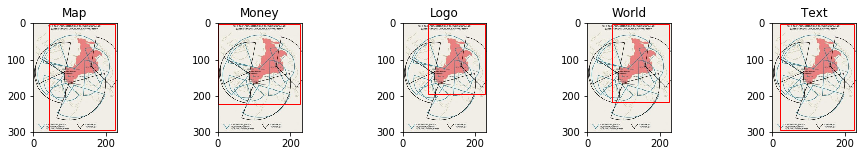

IC0011TRC.jpg.ldcc


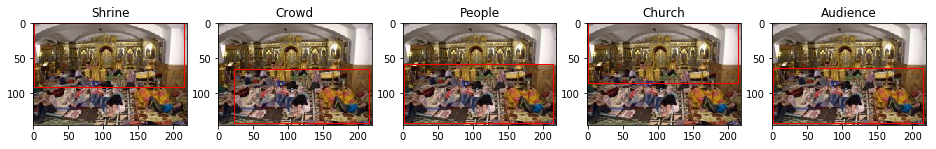

IC0011WO4.jpg.ldcc


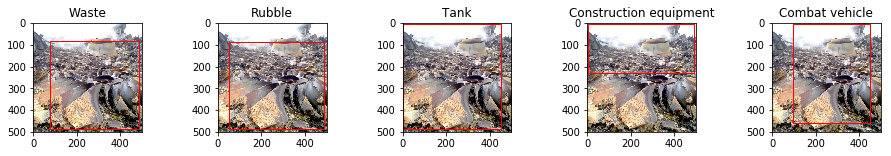

IC0011ZCT.jpg.ldcc


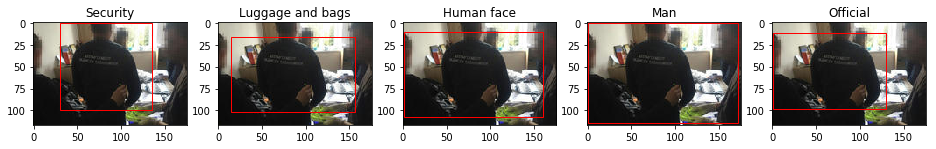

IC0011YIL.jpg.ldcc


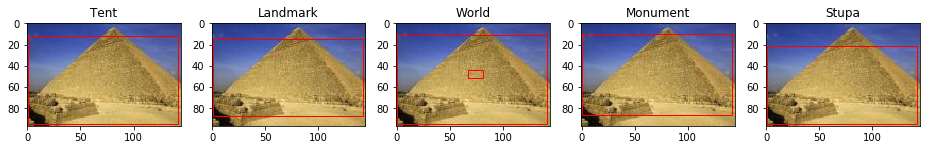

HC000SOR2.jpg.ldcc


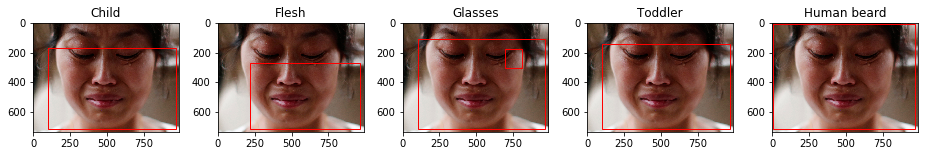

IC0011WMJ.jpg.ldcc


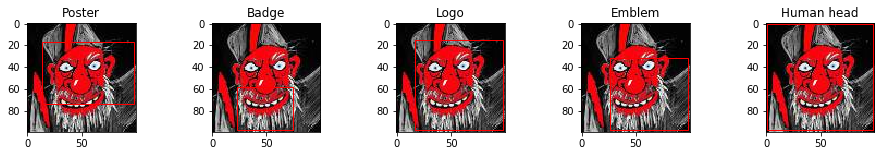

IC0011UC2.jpg.ldcc


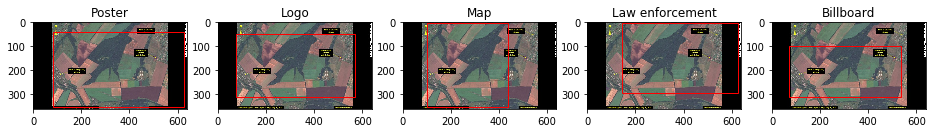

IC0011SXN.jpg.ldcc


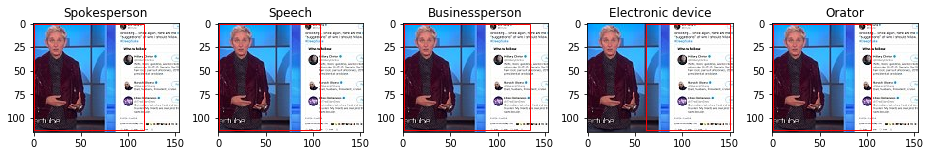

IC0011UFX.jpg.ldcc


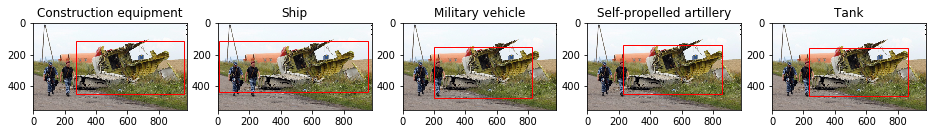

IC0011XKM.jpg.ldcc


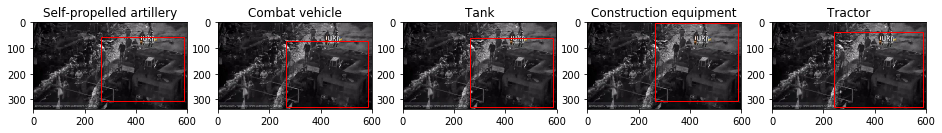

IC0011Z0D.jpg.ldcc


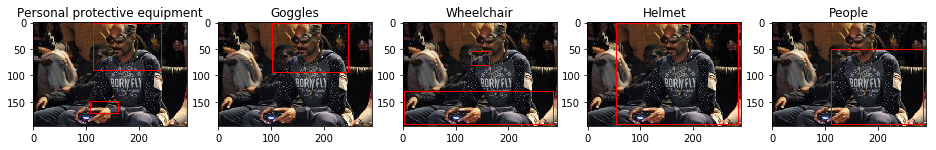

IC0011V61.jpg.ldcc


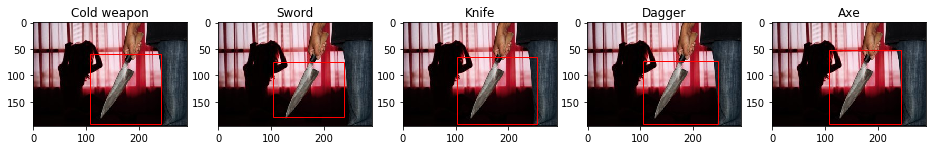

IC0011ZVM.jpg.ldcc


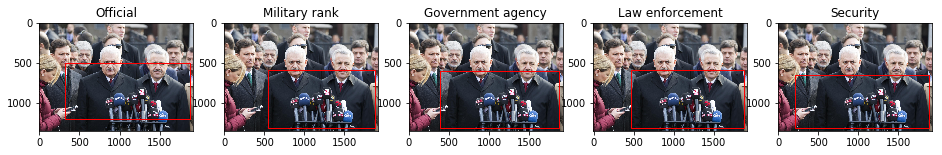

IC0011XKL.jpg.ldcc


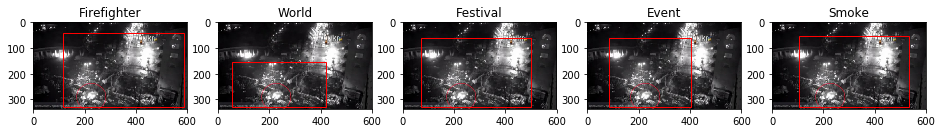

IC0011V0H.jpg.ldcc


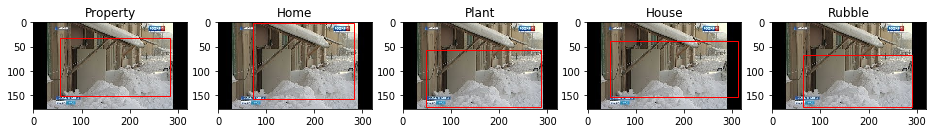

IC0011WFR.jpg.ldcc


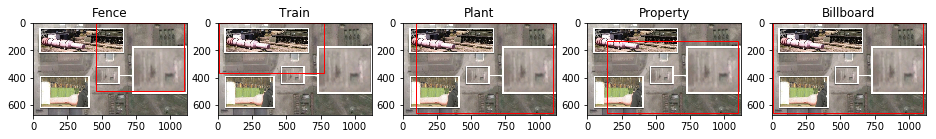

IC0011Z1A.jpg.ldcc


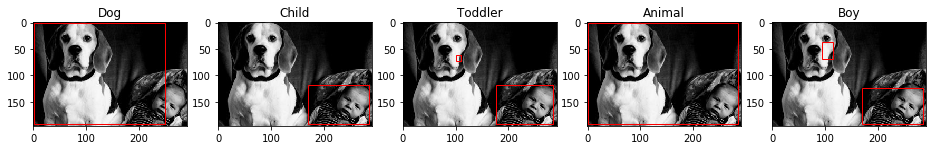

HC000SS1W.jpg.ldcc


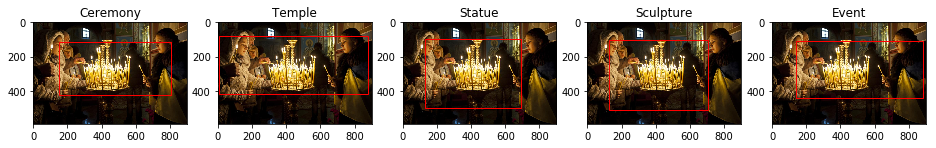

IC0011VX7.jpg.ldcc


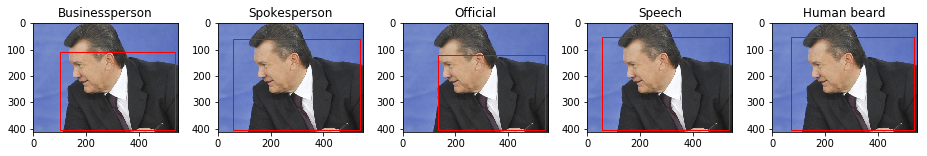

HC000SYFX.jpg.ldcc


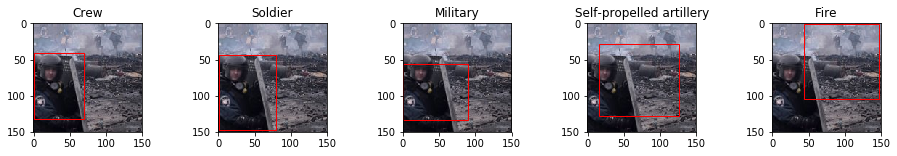

IC0011XIM.jpg.ldcc


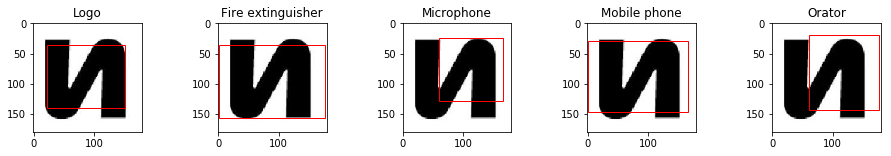

IC0011T4H.jpg.ldcc


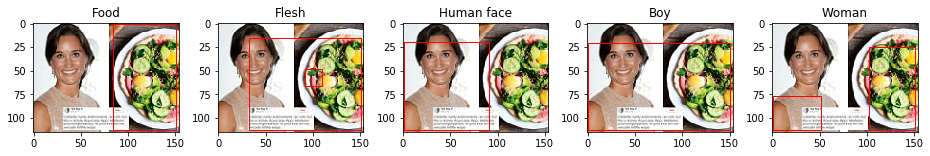

IC0011TMQ.jpg.ldcc


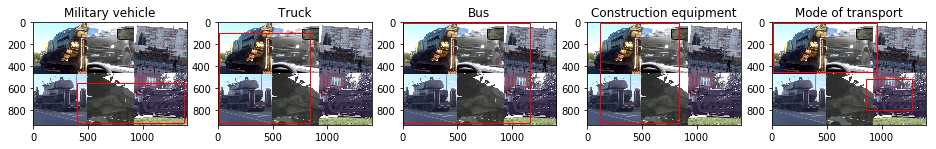

IC00120YX.jpg.ldcc


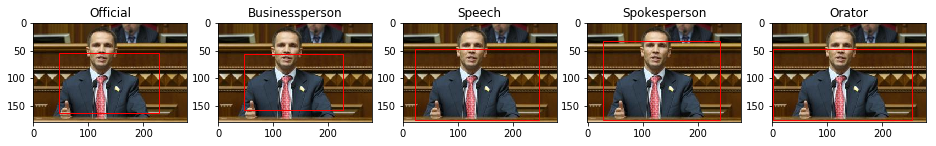

IC0011WF8.jpg.ldcc


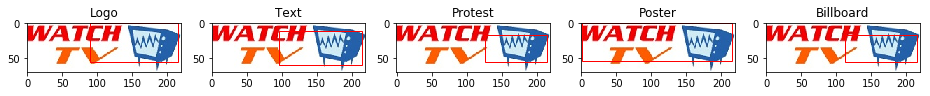

IC0011XKA.jpg.ldcc


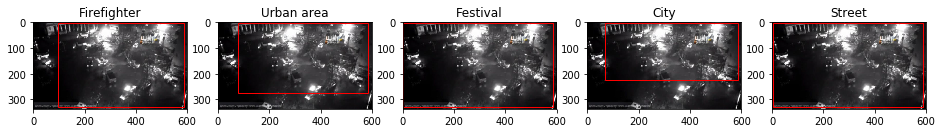

HC00025E5.jpg.ldcc


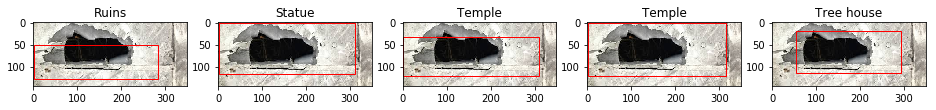

IC0011U7K.jpg.ldcc


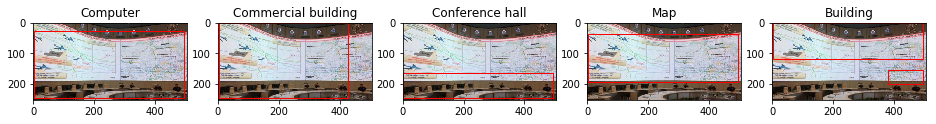

HC00000TL.jpg.ldcc


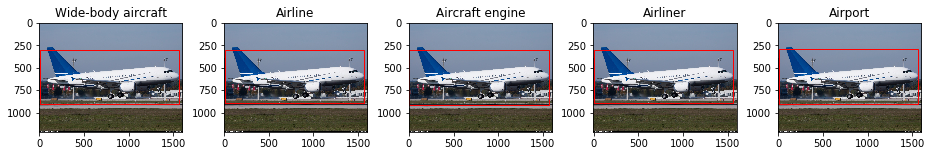

HC000SX0U.jpg.ldcc


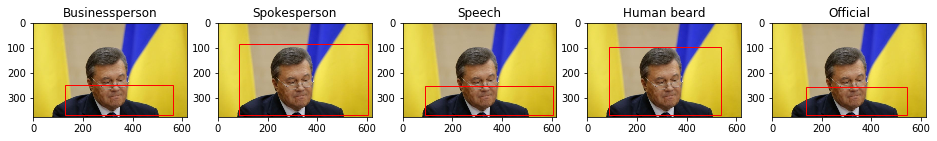

IC0011X1X.jpg.ldcc


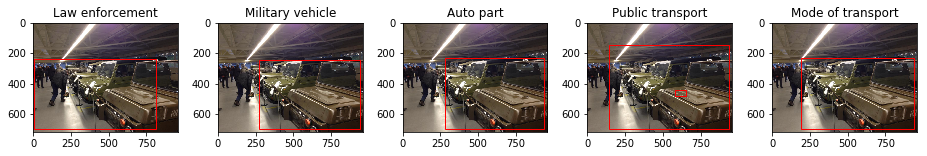

HC000SPLX.jpg.ldcc


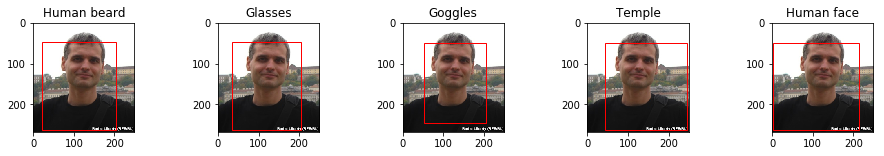

IC0011VRC.jpg.ldcc


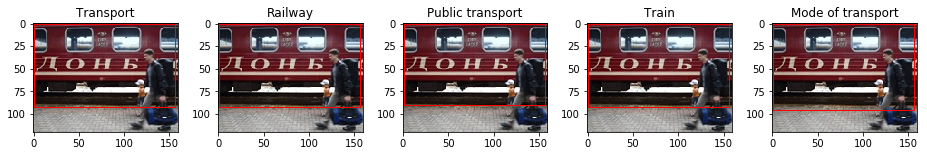

IC0011YVA.jpg.ldcc


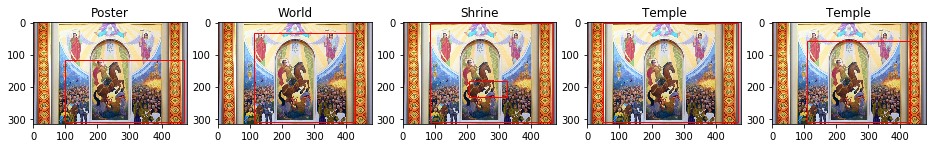

IC0011Y6O.jpg.ldcc


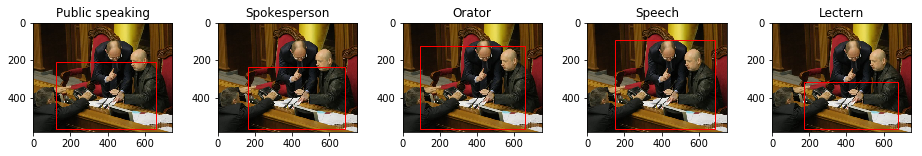

In [23]:
topk_vis = 5
for _ in range(50):
    filename = np.random.choice(test_img_filenames)
    imgid = filename.split('/')[-1]
    print(imgid)
    with open(filename, 'rb') as fin:
        _ = fin.read(1024)
        imgbin = fin.read()
    imgbgr = cv2.imdecode(np.fromstring(imgbin, dtype='uint8'), cv2.IMREAD_COLOR)
    imgrgb = imgbgr[:,:,[2,1,0]]        
    height, width, _ = imgrgb.shape

    #print([mid2name[item['label']] for item in annot[imgid]]) 
    
    fig, axes = plt.subplots(1, topk_vis, figsize=(16, 2))        
    
    for ii in range(topk_vis):
        axes[ii].imshow(imgrgb)
        axes[ii].set_title(mid2name[all_labels[det_results[imgid]['sorted_labels'][ii]]])
        for box in det_results[imgid]['sorted_bboxes'][ii][1::2]:
            axes[ii].add_patch(patches.Rectangle(
                (box[0]*width, box[1]*height), (box[2]-box[0])*width, (box[3]-box[1])*height,
                linewidth=1, edgecolor='r', facecolor='none'
            ))
            
    plt.show()

IC0011T4Y.jpg.ldcc


/home/alireza/home_at_filer2/tools/anaconda3/envs/py3torch/lib/python3.6/site-packages/ipykernel/__main__.py:9: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


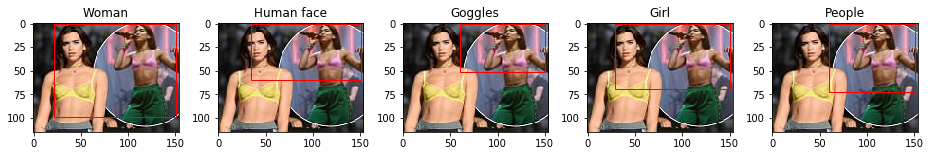

IC0011YP1.jpg.ldcc


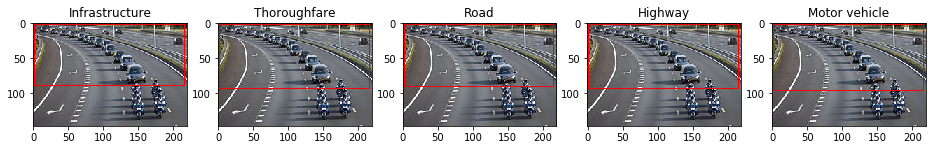

IC0011WFL.jpg.ldcc


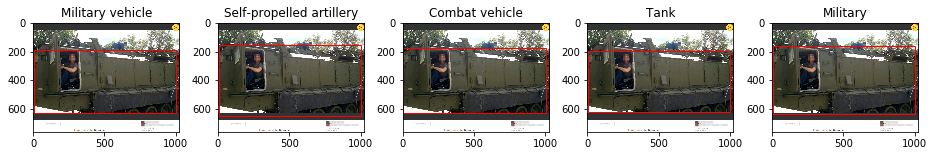

IC0011SIE.jpg.ldcc


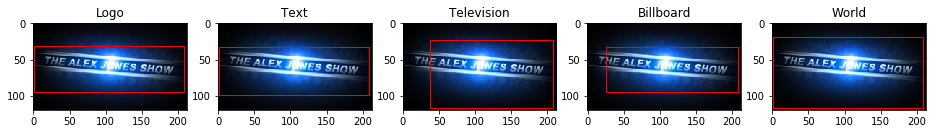

IC0011W50.jpg.ldcc


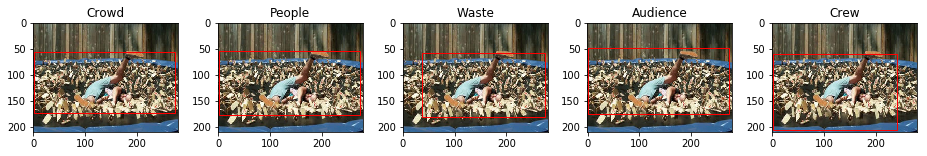

IC0011YP5.jpg.ldcc


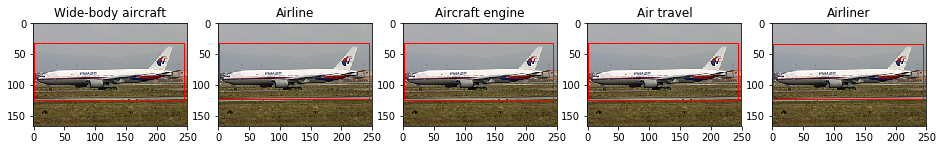

IC0011T90.jpg.ldcc


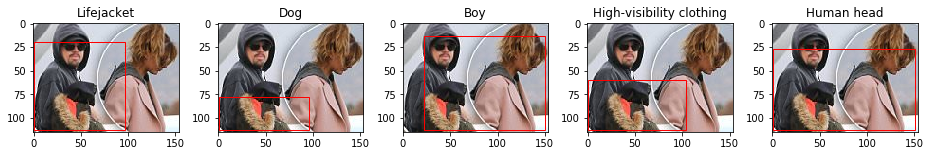

IC00158AO.jpg.ldcc


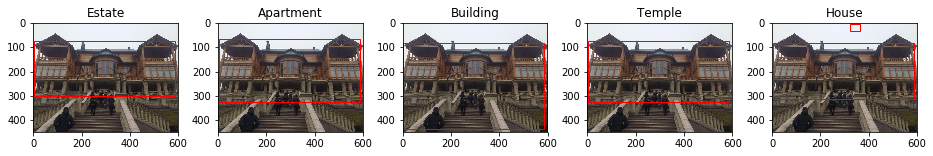

IC0011VHU.jpg.ldcc


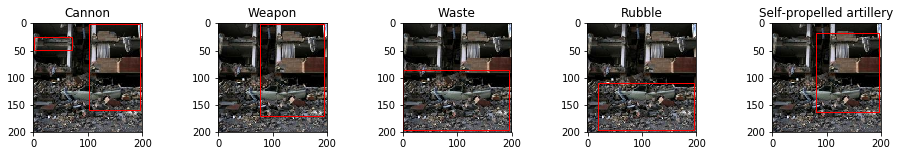

HC000ZIYC.jpg.ldcc


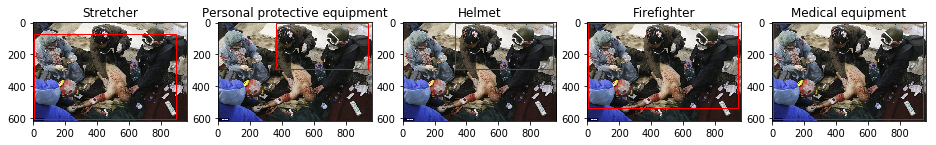

HC000Q8O8.jpg.ldcc


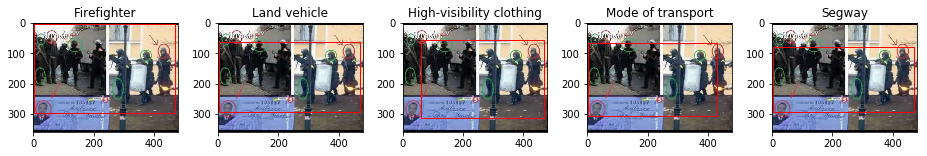

HC000SP6K.jpg.ldcc


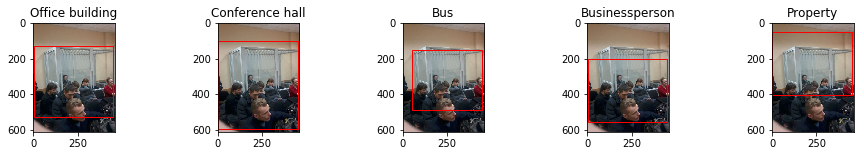

IC0011UH8.jpg.ldcc


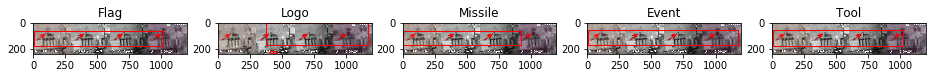

IC00150I0.jpg.ldcc


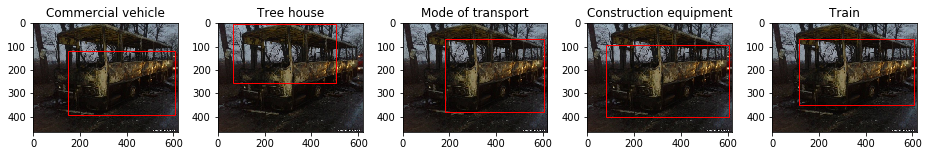

HC000SWCU.jpg.ldcc


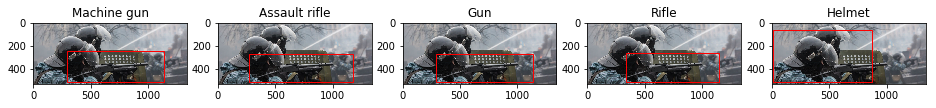

HC000ZIZH.jpg.ldcc


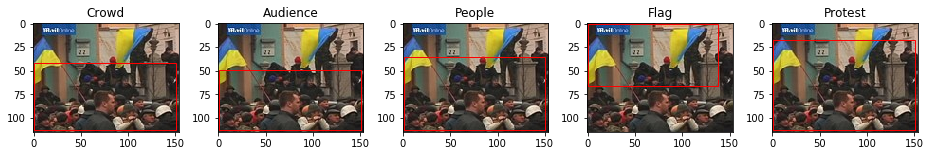

IC0011TX4.jpg.ldcc


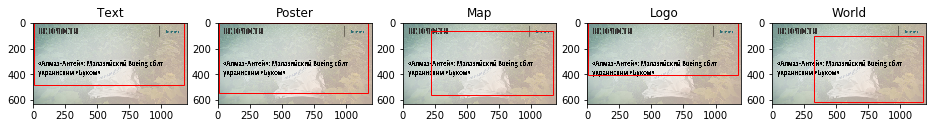

HC000SOMG.jpg.ldcc


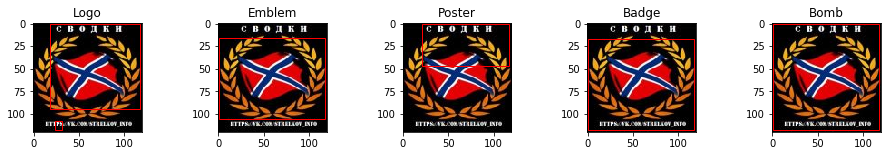

IC00120UF.jpg.ldcc


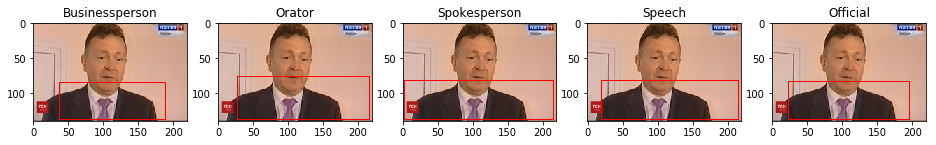

IC0011V8J.jpg.ldcc


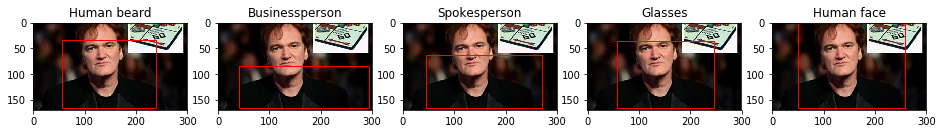

IC0011SHB.jpg.ldcc


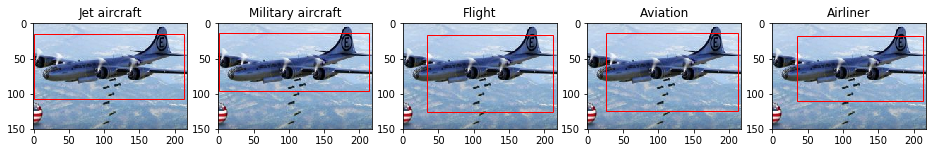

HC000SOR8.jpg.ldcc


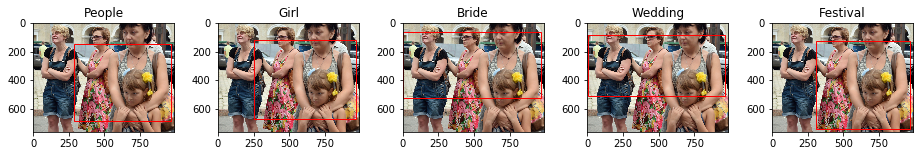

IC0011TNI.jpg.ldcc


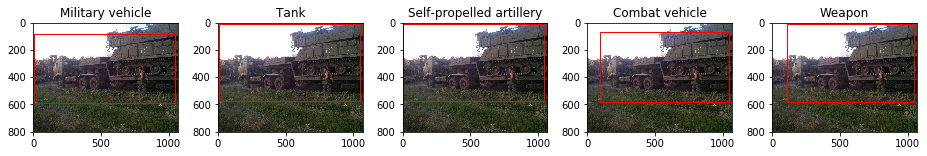

IC0011WX1.jpg.ldcc


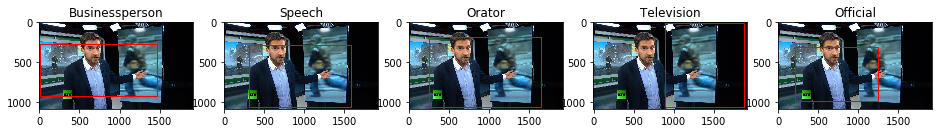

IC0011VC2.jpg.ldcc


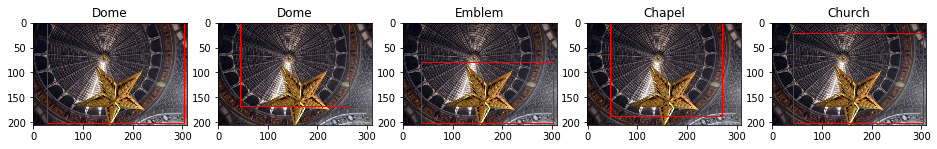

IC0011XK3.jpg.ldcc


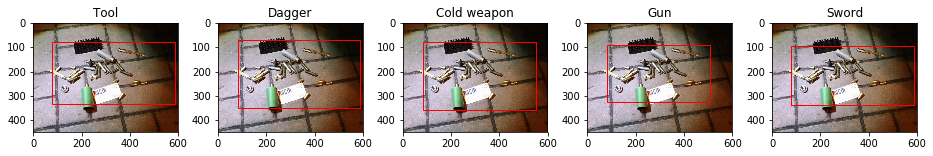

IC0011VCC.jpg.ldcc


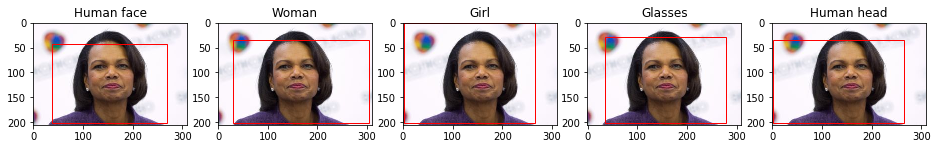

IC0011T9G.jpg.ldcc


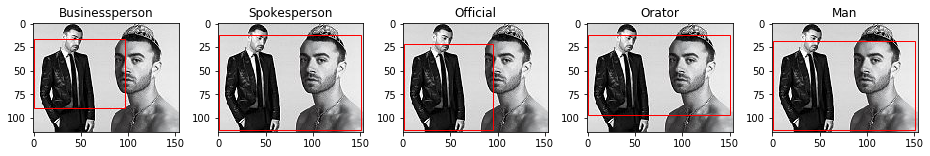

HC000068I.jpg.ldcc


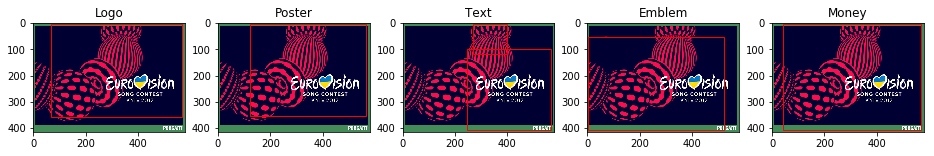

IC0011YUF.jpg.ldcc


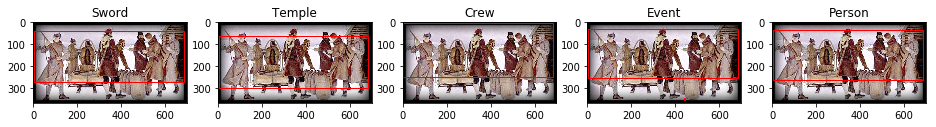

HC000SXZD.jpg.ldcc


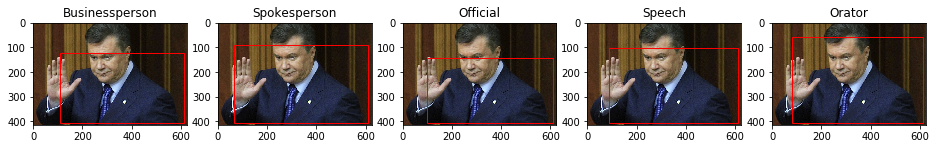

IC0011SPE.jpg.ldcc


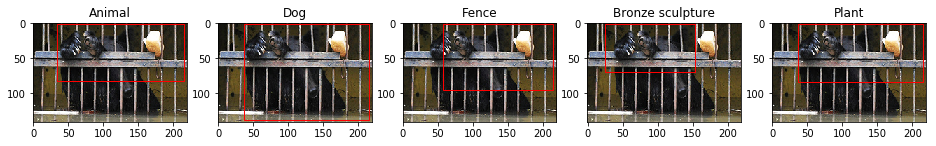

IC0011VOV.jpg.ldcc


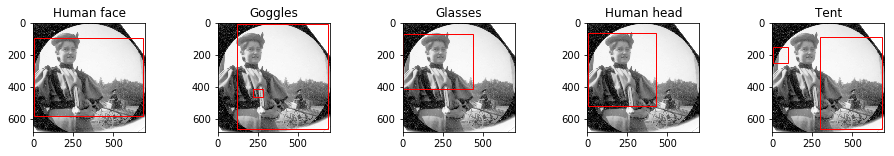

HC00000AJ.jpg.ldcc


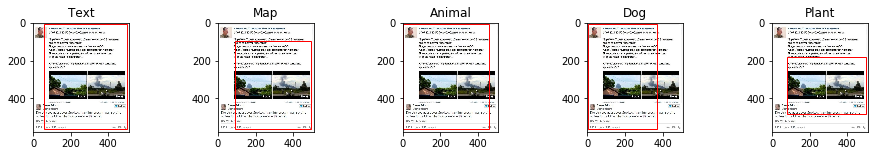

IC0011T2O.jpg.ldcc


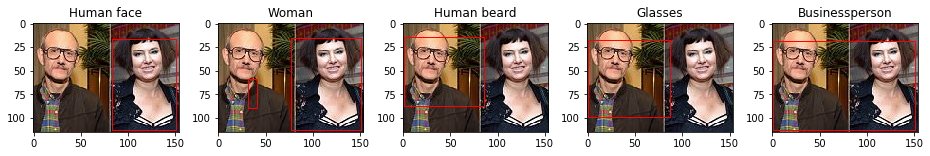

IC0011VR9.jpg.ldcc


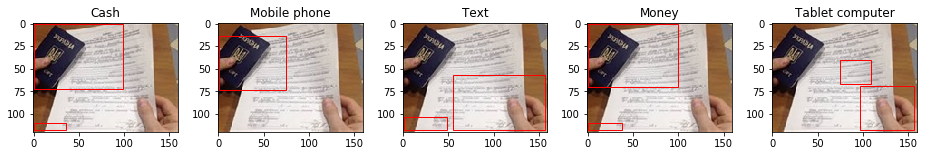

IC0015NCC.jpg.ldcc


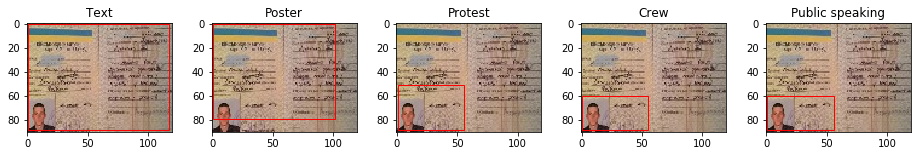

HC00000HJ.jpg.ldcc


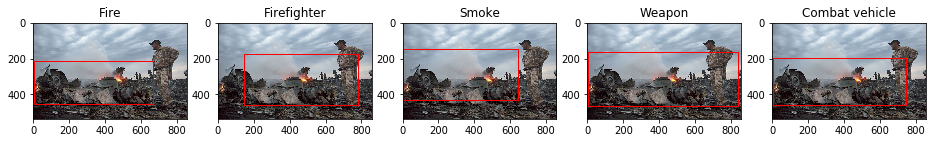

IC0011YIK.jpg.ldcc


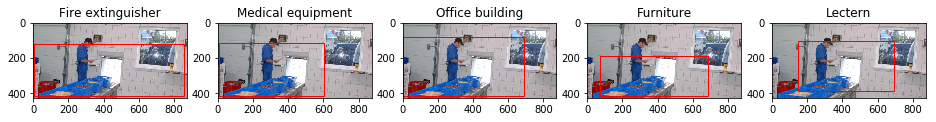

IC0011XL6.jpg.ldcc


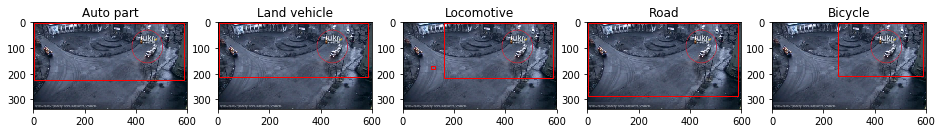

IC0011TV3.jpg.ldcc


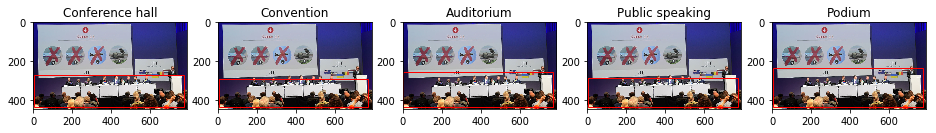

IC0011T5B.jpg.ldcc


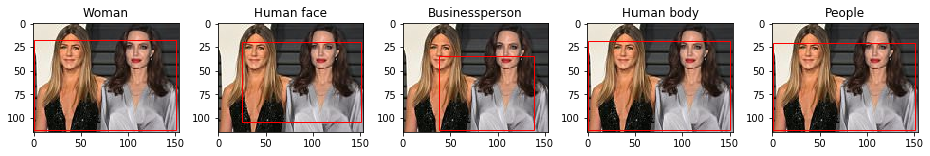

IC0011XLN.jpg.ldcc


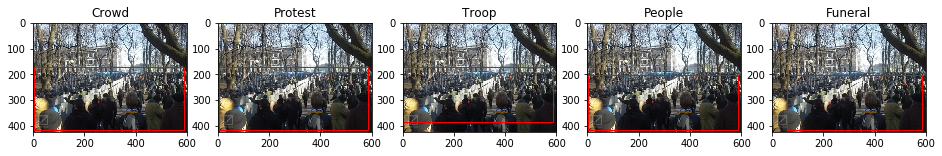

IC0011V9Z.jpg.ldcc


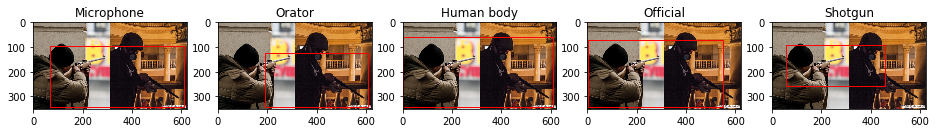

HC00001WG.jpg.ldcc


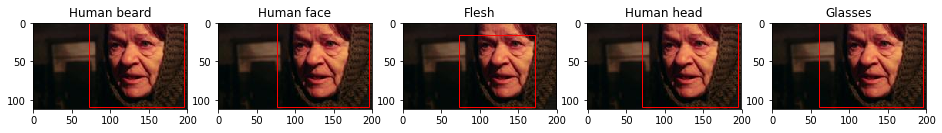

HC00025FT.jpg.ldcc


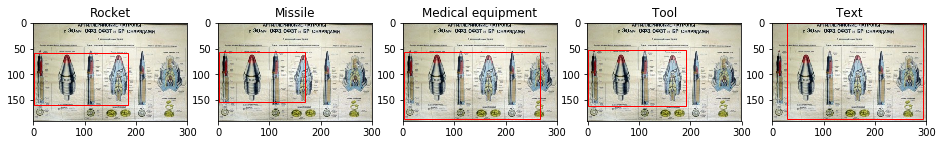

HC000SPNJ.jpg.ldcc


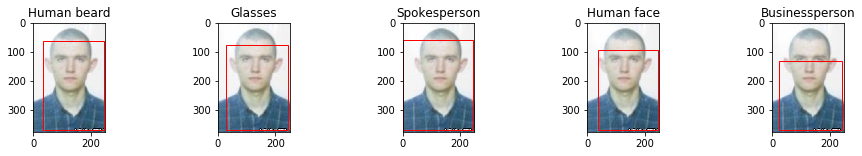

IC0011T6K.jpg.ldcc


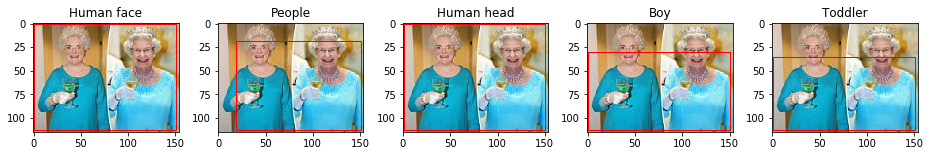

IC0011WES.jpg.ldcc


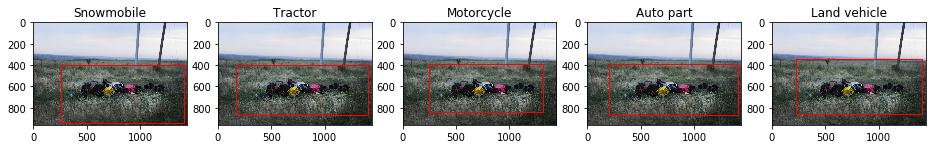

IC0011V6R.jpg.ldcc


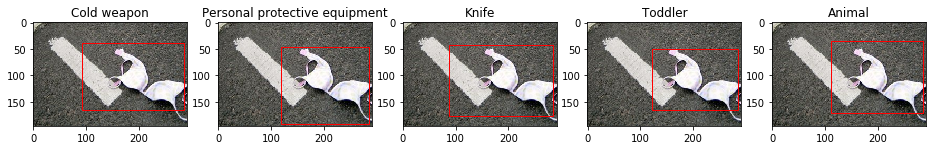

In [24]:
topk_vis = 5
for _ in range(50):
    filename = np.random.choice(test_img_filenames)
    imgid = filename.split('/')[-1]
    print(imgid)
    with open(filename, 'rb') as fin:
        _ = fin.read(1024)
        imgbin = fin.read()
    imgbgr = cv2.imdecode(np.fromstring(imgbin, dtype='uint8'), cv2.IMREAD_COLOR)
    imgrgb = imgbgr[:,:,[2,1,0]]        
    height, width, _ = imgrgb.shape

    #print([mid2name[item['label']] for item in annot[imgid]]) 
    
    fig, axes = plt.subplots(1, topk_vis, figsize=(16, 2))        
    
    for ii in range(topk_vis):
        axes[ii].imshow(imgrgb)
        axes[ii].set_title(mid2name[all_labels[det_results[imgid]['sorted_labels'][ii]]])
        for box in det_results[imgid]['sorted_bboxes'][ii][1::2]:
            axes[ii].add_patch(patches.Rectangle(
                (box[0]*width, box[1]*height), (box[2]-box[0])*width, (box[3]-box[1])*height,
                linewidth=1, edgecolor='r', facecolor='none'
            ))
            
    plt.show()

IC0011UL0.jpg.ldcc


/home/alireza/home_at_filer2/tools/anaconda3/envs/py3torch/lib/python3.6/site-packages/ipykernel/__main__.py:9: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


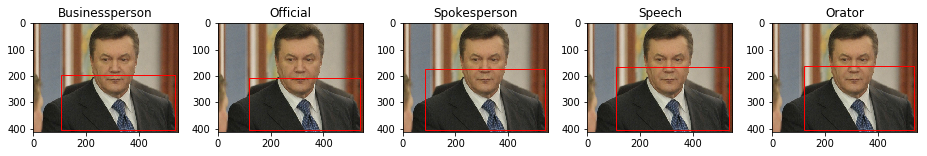

IC0011VOI.jpg.ldcc


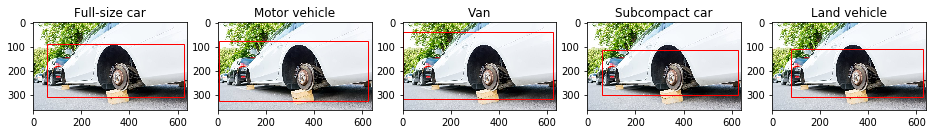

IC0011VZ1.jpg.ldcc


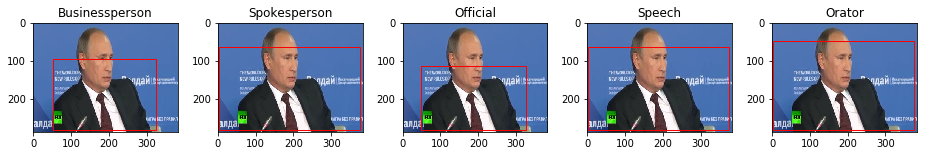

IC0011Y9J.jpg.ldcc


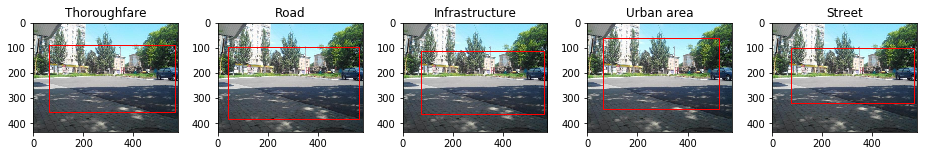

IC0011XIK.jpg.ldcc


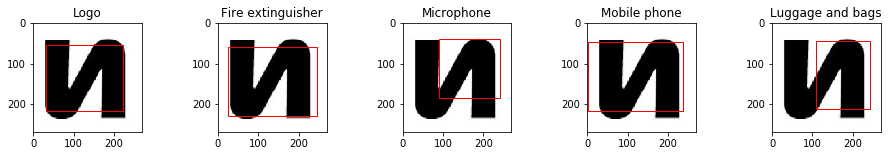

IC0011T83.jpg.ldcc


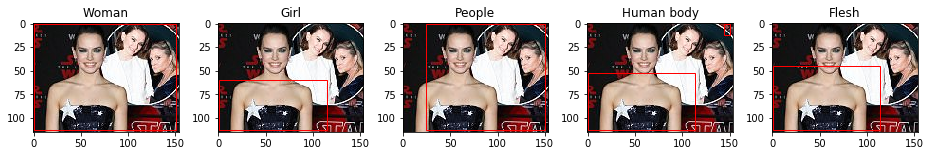

HC00001VJ.jpg.ldcc


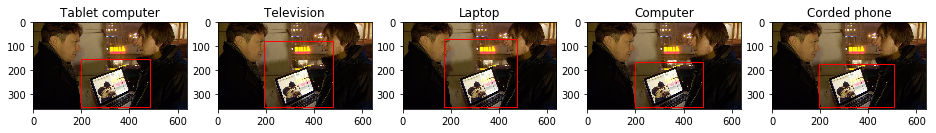

IC0011TAT.jpg.ldcc


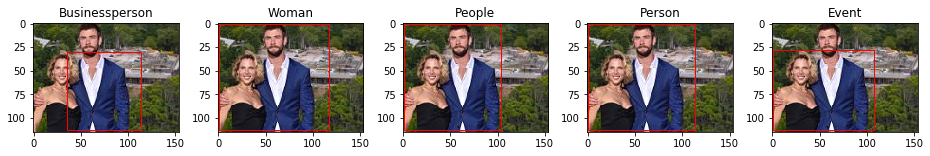

HC000SP2S.jpg.ldcc


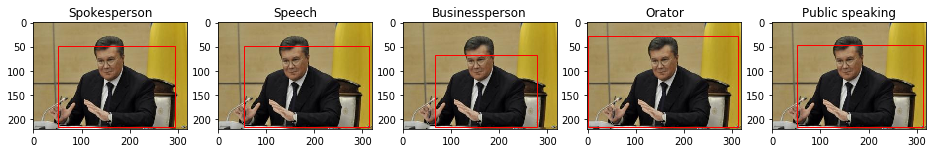

IC00158AO.jpg.ldcc


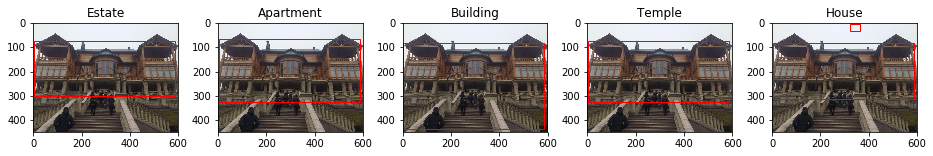

HC000SOKS.jpg.ldcc


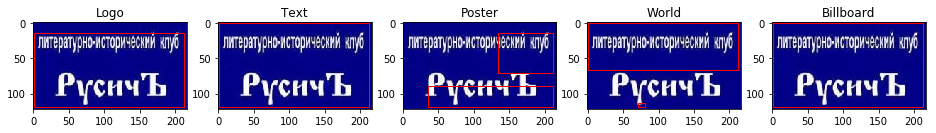

IC0011SHA.jpg.ldcc


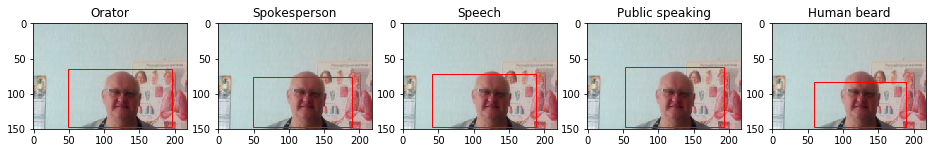

IC0011UHB.jpg.ldcc


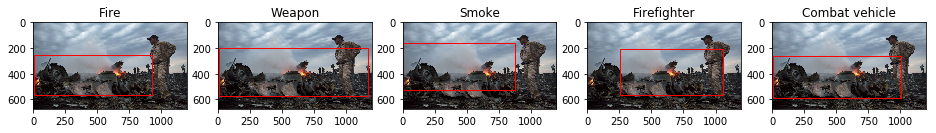

HC000SXUR.jpg.ldcc


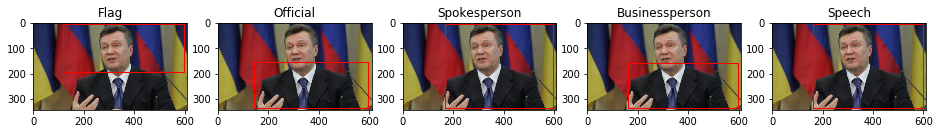

IC0011WAE.jpg.ldcc


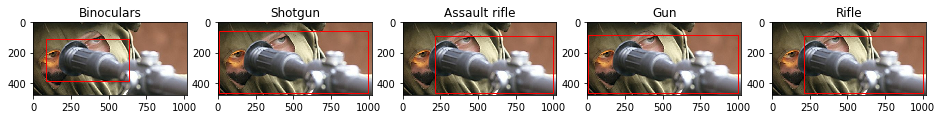

IC0011T8D.jpg.ldcc


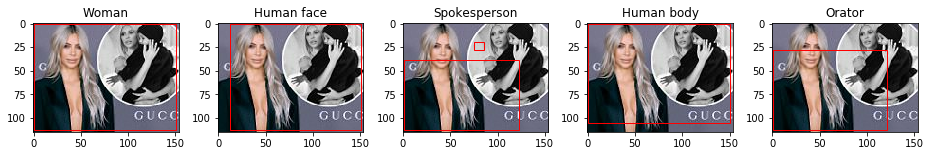

IC0011XUE.jpg.ldcc


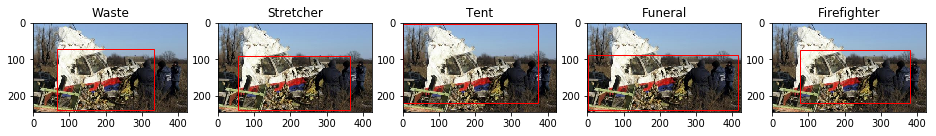

IC0011XIW.jpg.ldcc


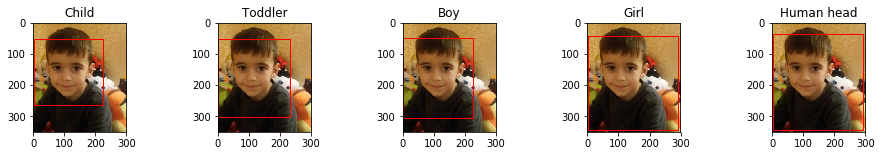

IC0011V7I.jpg.ldcc


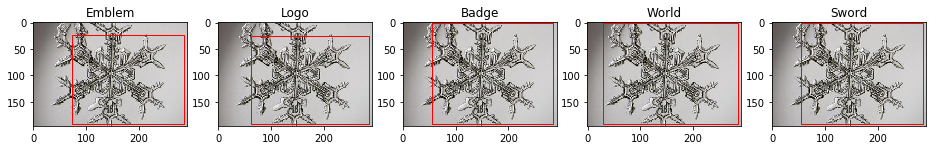

IC0011UFM.jpg.ldcc


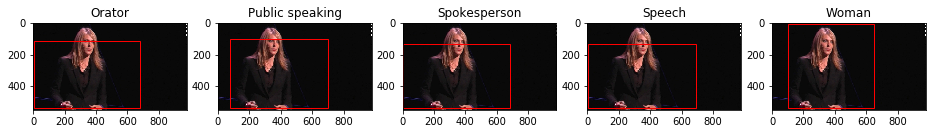

HC000SOOK.jpg.ldcc


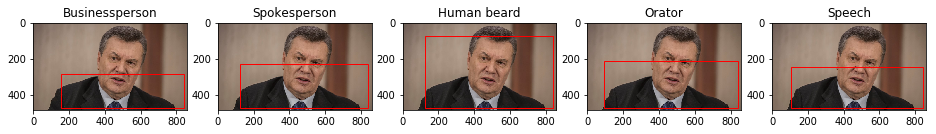

IC0011UEV.jpg.ldcc


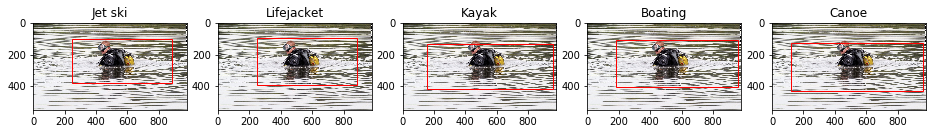

IC0011UPR.jpg.ldcc


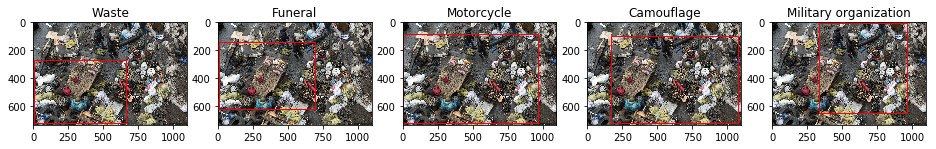

IC0011VRQ.jpg.ldcc


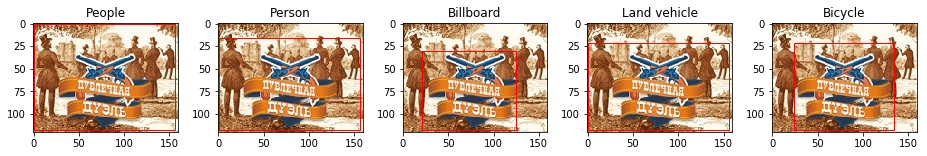

HC000Q8DE.jpg.ldcc


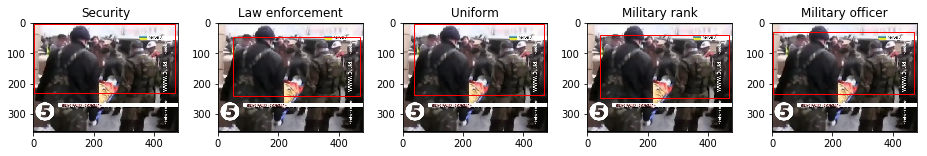

HC000SPLZ.jpg.ldcc


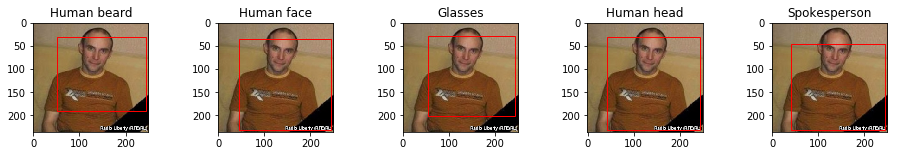

HC000ZJQC.jpg.ldcc


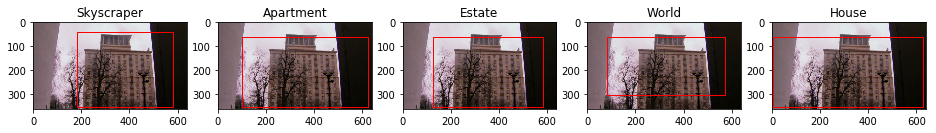

IC0011T5N.jpg.ldcc


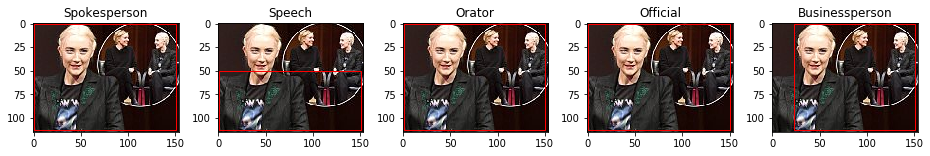

HC000SVRL.jpg.ldcc


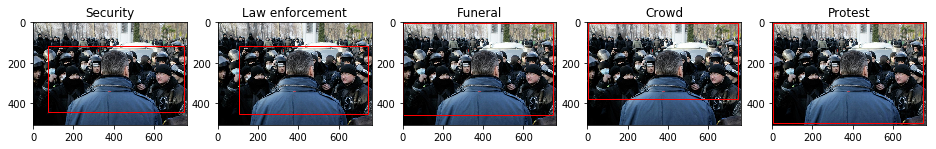

IC0011YTX.jpg.ldcc


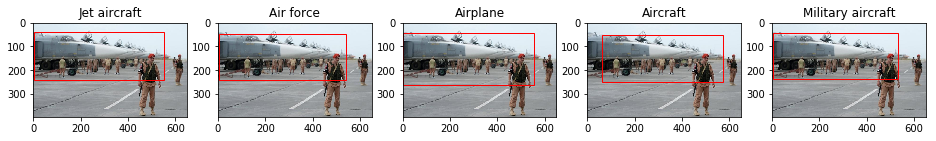

IC0011VOS.jpg.ldcc


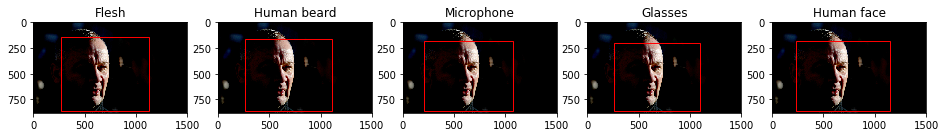

IC0011V4D.jpg.ldcc


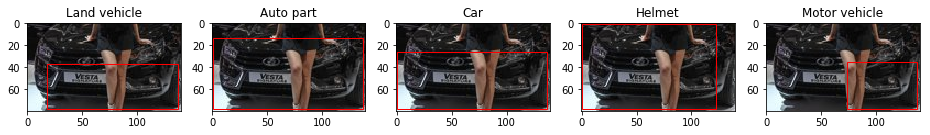

HC000SXW8.jpg.ldcc


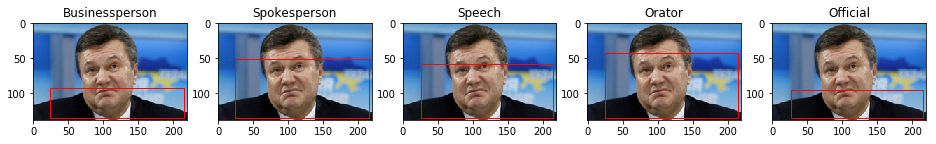

IC0011TB8.jpg.ldcc


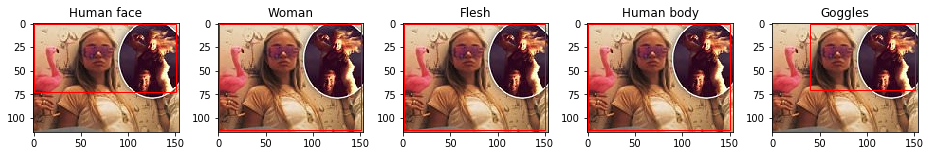

IC0011V73.jpg.ldcc


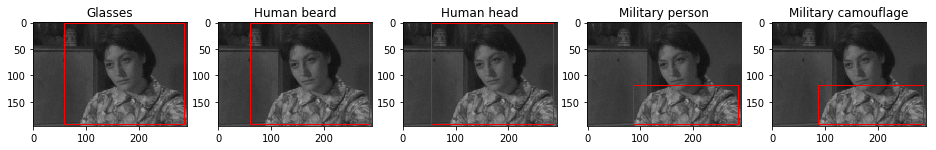

IC0011VEG.jpg.ldcc


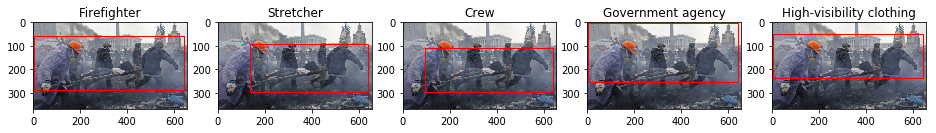

IC00120FT.jpg.ldcc


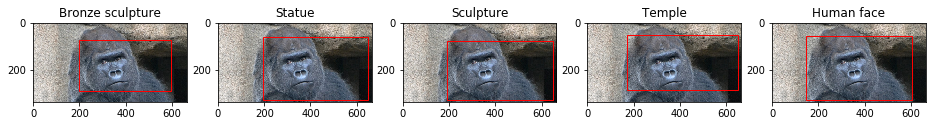

IC0011T8T.jpg.ldcc


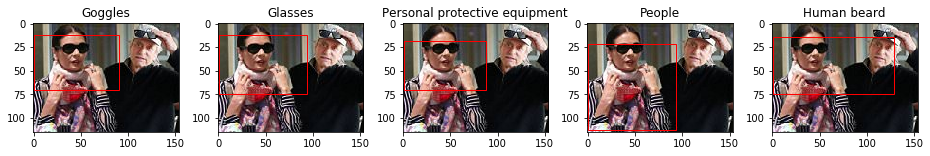

HC00025EE.jpg.ldcc


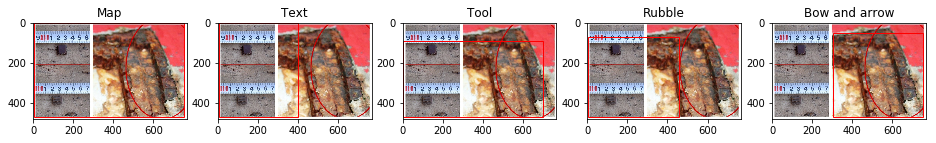

IC0011XKR.jpg.ldcc


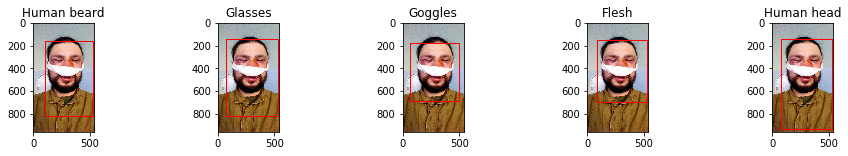

IC0011T2Z.jpg.ldcc


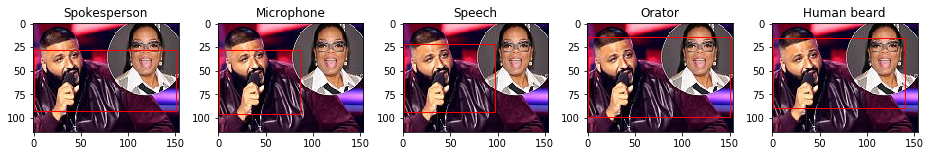

IC0011ZA0.jpg.ldcc


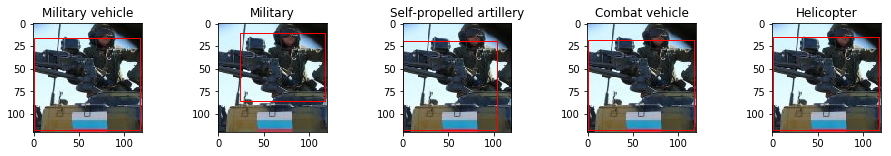

HC000SOID.jpg.ldcc


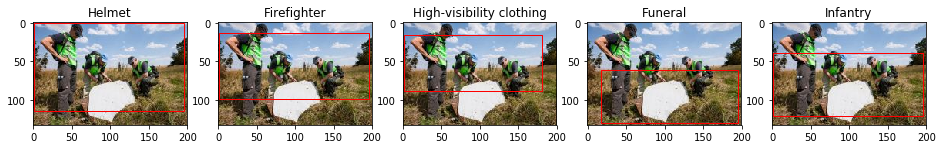

HC00055NO.jpg.ldcc


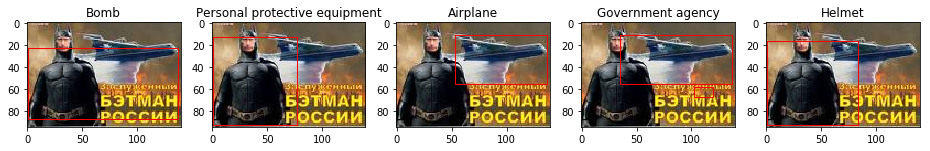

HC000SWDT.jpg.ldcc


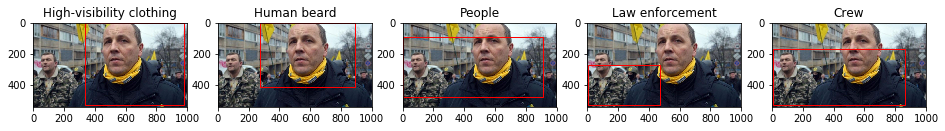

IC0011UEJ.jpg.ldcc


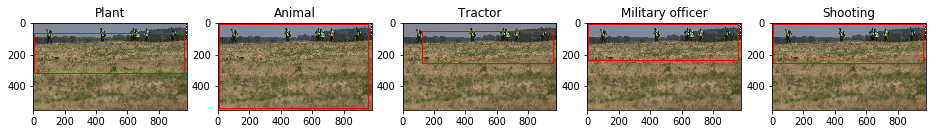

IC0011T4O.jpg.ldcc


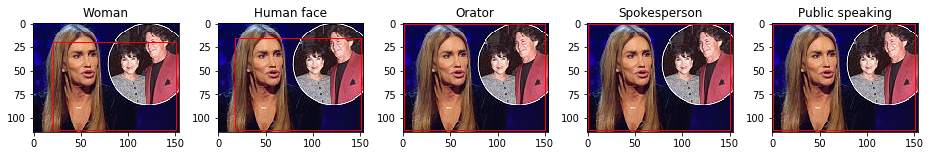

HC000SNSL.jpg.ldcc


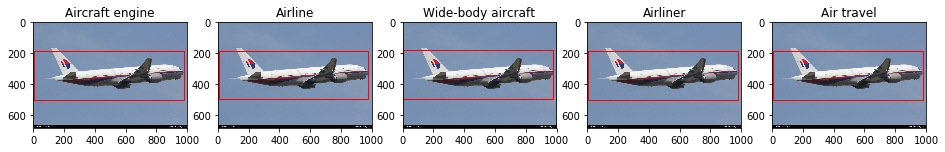

IC0011V9U.jpg.ldcc


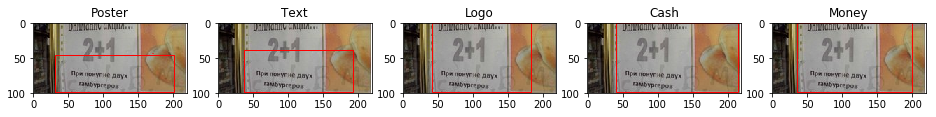

IC0011V5V.jpg.ldcc


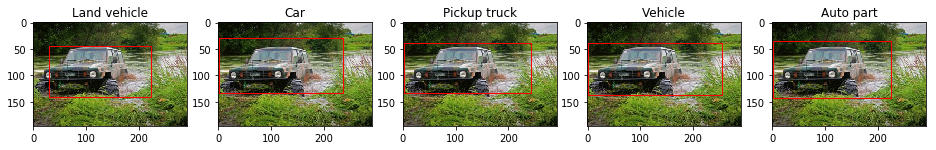

In [25]:
topk_vis = 5
for _ in range(50):
    filename = np.random.choice(test_img_filenames)
    imgid = filename.split('/')[-1]
    print(imgid)
    with open(filename, 'rb') as fin:
        _ = fin.read(1024)
        imgbin = fin.read()
    imgbgr = cv2.imdecode(np.fromstring(imgbin, dtype='uint8'), cv2.IMREAD_COLOR)
    imgrgb = imgbgr[:,:,[2,1,0]]        
    height, width, _ = imgrgb.shape

    #print([mid2name[item['label']] for item in annot[imgid]]) 
    
    fig, axes = plt.subplots(1, topk_vis, figsize=(16, 2))        
    
    for ii in range(topk_vis):
        axes[ii].imshow(imgrgb)
        axes[ii].set_title(mid2name[all_labels[det_results[imgid]['sorted_labels'][ii]]])
        for box in det_results[imgid]['sorted_bboxes'][ii][1::2]:
            axes[ii].add_patch(patches.Rectangle(
                (box[0]*width, box[1]*height), (box[2]-box[0])*width, (box[3]-box[1])*height,
                linewidth=1, edgecolor='r', facecolor='none'
            ))
            
    plt.show()

IC0011Z0D.jpg.ldcc


/home/alireza/home_at_filer2/tools/anaconda3/envs/py3torch/lib/python3.6/site-packages/ipykernel/__main__.py:9: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


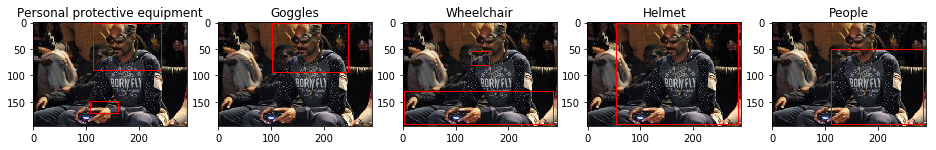

IC0011TC7.jpg.ldcc


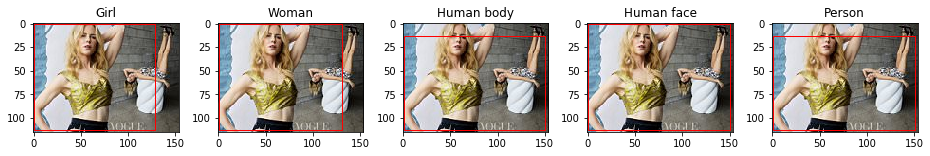

IC00121CZ.jpg.ldcc


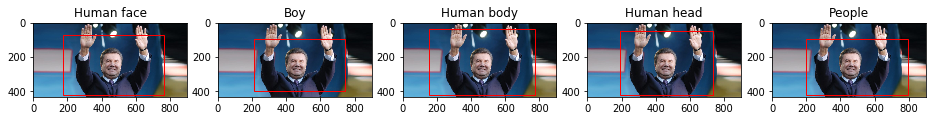

HC000SS1K.jpg.ldcc


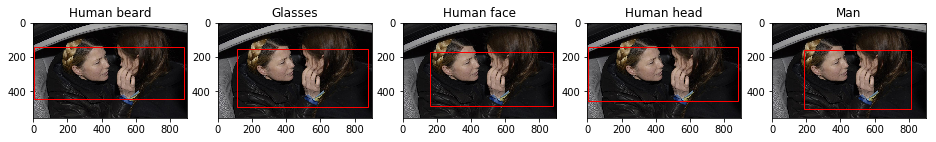

HC000SPLQ.jpg.ldcc


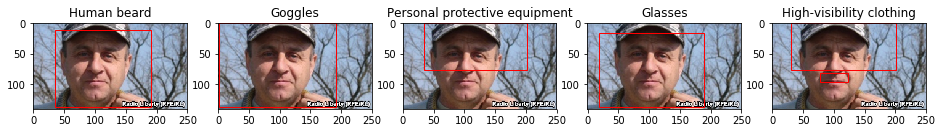

IC0011ZA4.jpg.ldcc


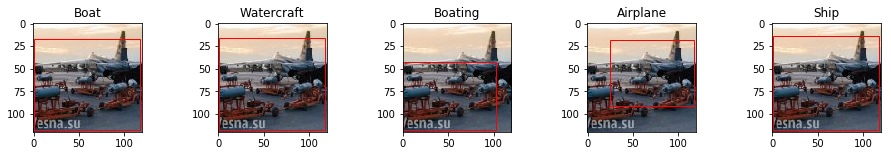

IC00120Y8.jpg.ldcc


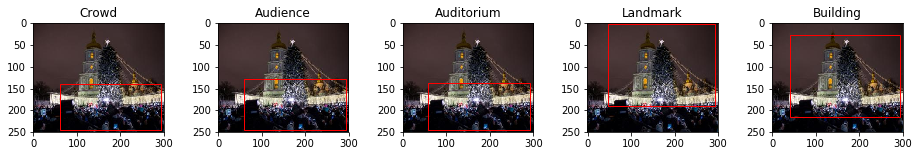

IC0011T9N.jpg.ldcc


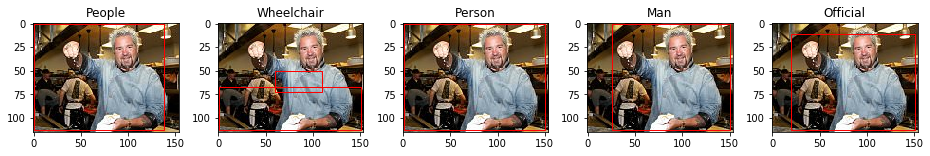

IC0011TNJ.jpg.ldcc


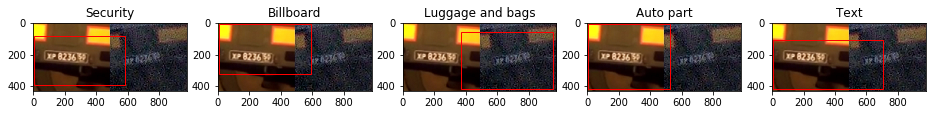

IC0011V6A.jpg.ldcc


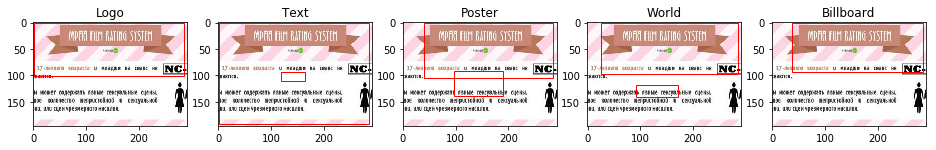

IC0011TFT.jpg.ldcc


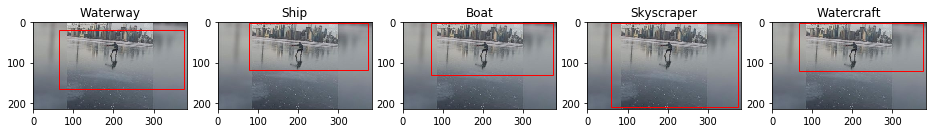

IC0011W01.jpg.ldcc


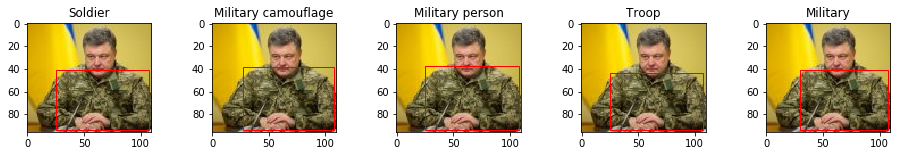

IC0011TFD.jpg.ldcc


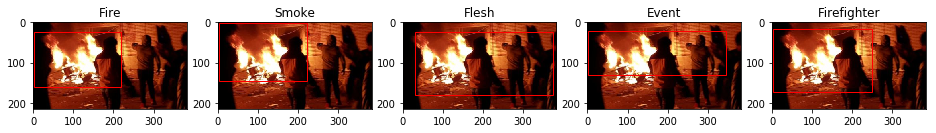

IC0011T6K.jpg.ldcc


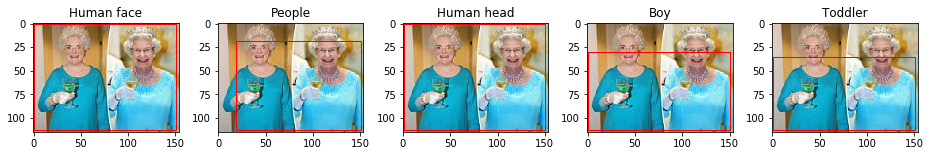

HC000ZK8F.jpg.ldcc


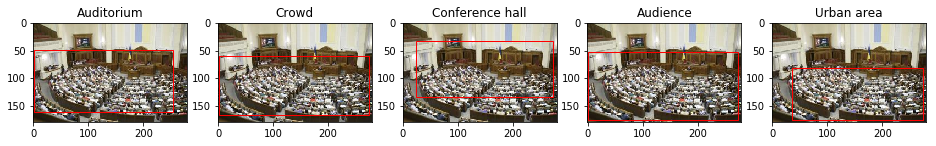

HC00001WK.jpg.ldcc


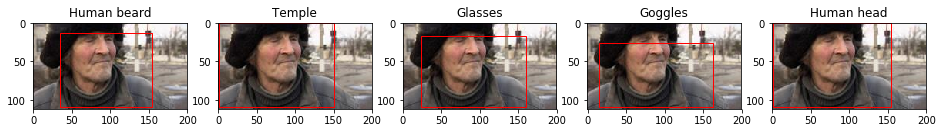

IC0011VOK.jpg.ldcc


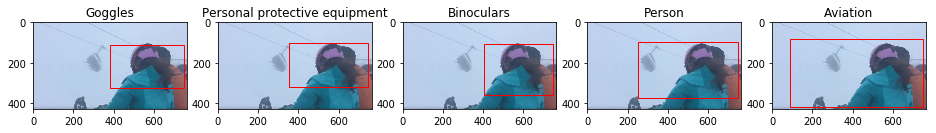

IC0011SHD.jpg.ldcc


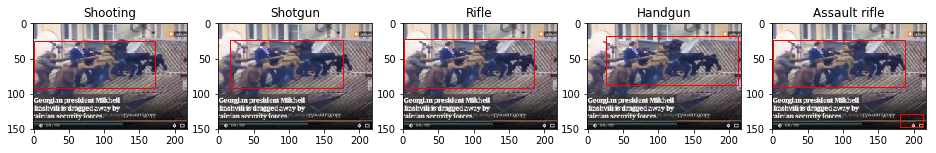

IC0011ZGG.jpg.ldcc


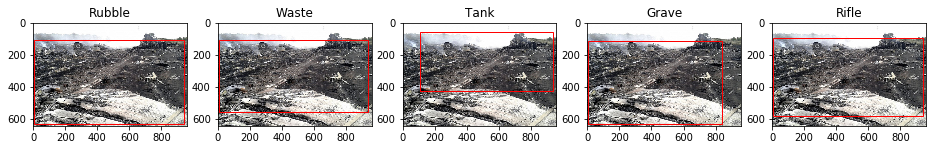

HC00000RC.jpg.ldcc


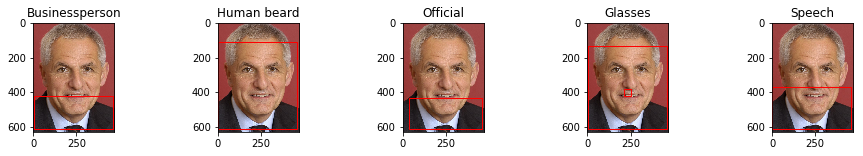

IC0011YIL.jpg.ldcc


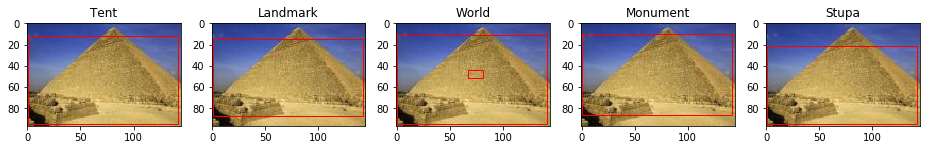

HC00027WR.jpg.ldcc


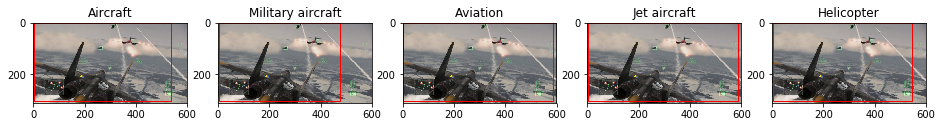

IC0011UPT.jpg.ldcc


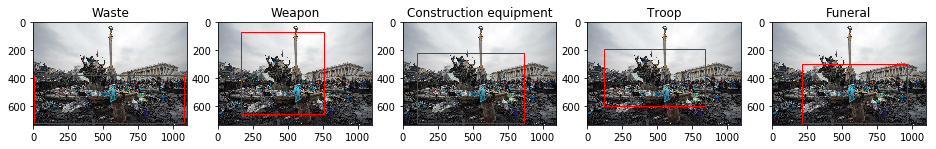

HC000Q8D0.jpg.ldcc


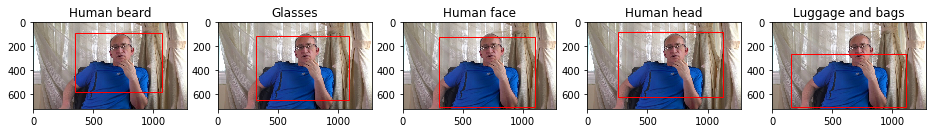

IC0011VD5.jpg.ldcc


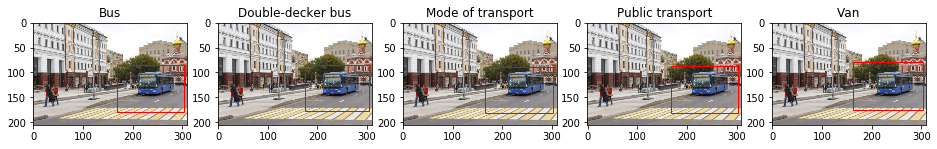

HC00025FH.jpg.ldcc


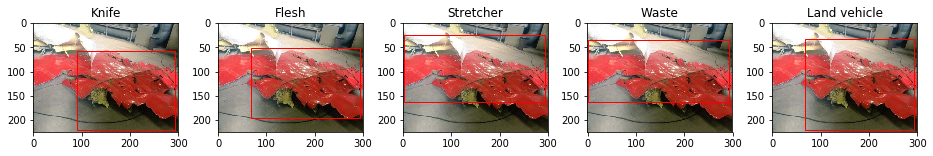

IC0011T5K.jpg.ldcc


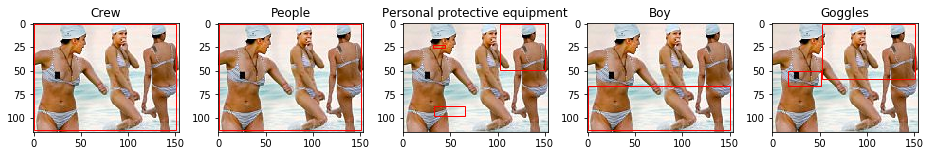

IC001522W.jpg.ldcc


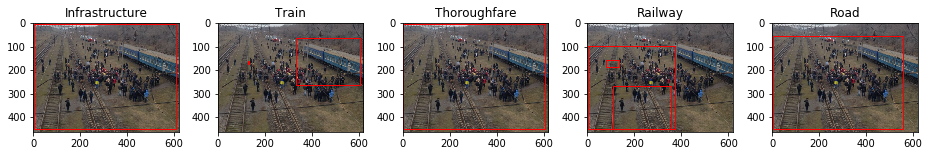

IC0011UFD.jpg.ldcc


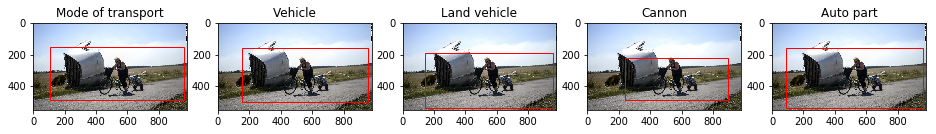

IC0011UED.jpg.ldcc


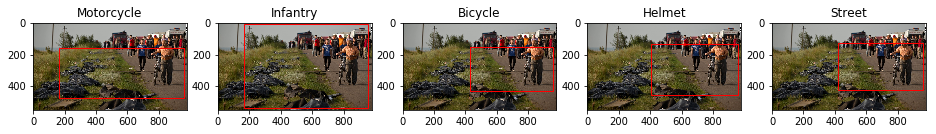

HC000SOQN.jpg.ldcc


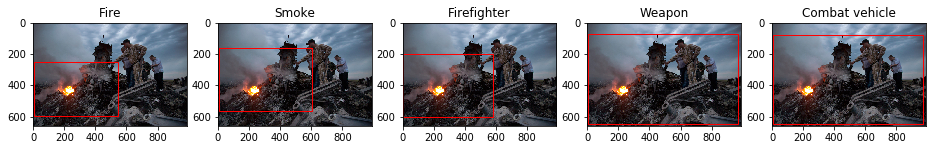

IC0011W95.jpg.ldcc


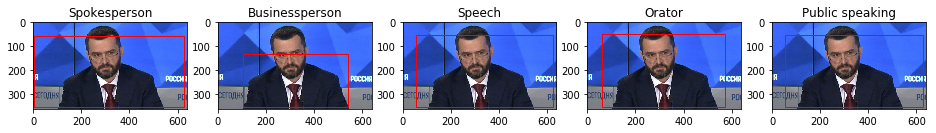

IC0011WX1.jpg.ldcc


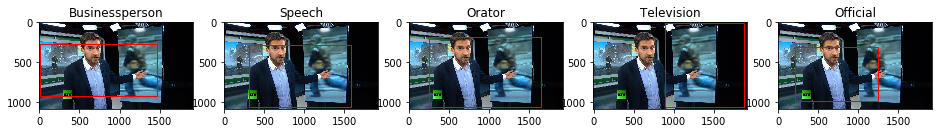

HC000SP91.jpg.ldcc


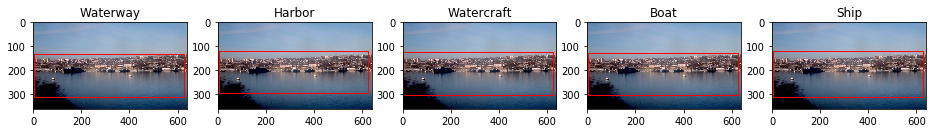

HC000SOSJ.jpg.ldcc


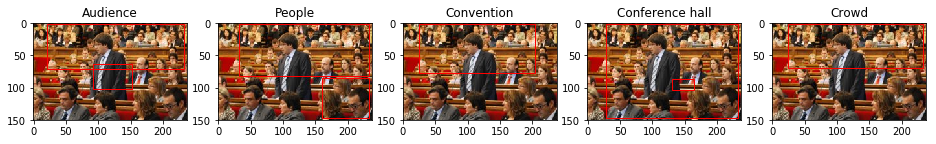

HC00025H4.jpg.ldcc


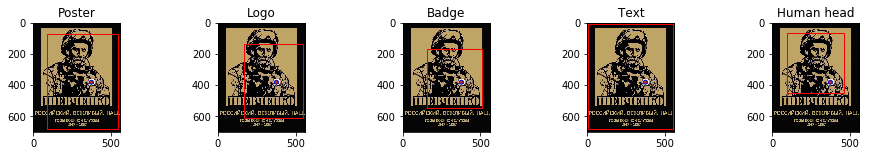

IC0011VCV.jpg.ldcc


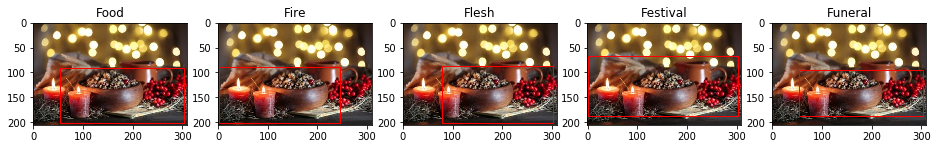

IC001522G.jpg.ldcc


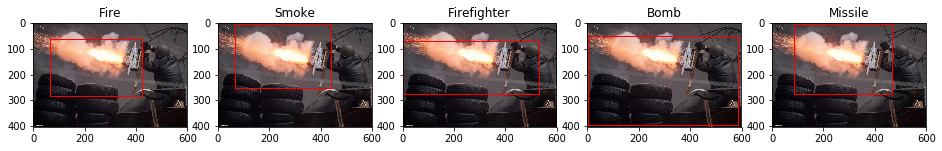

IC0011TE7.jpg.ldcc


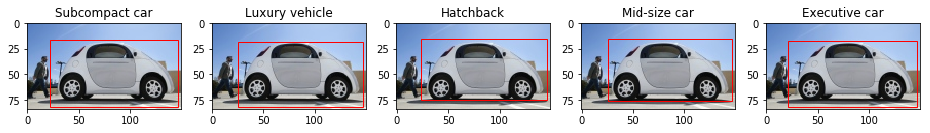

HC000SP74.jpg.ldcc


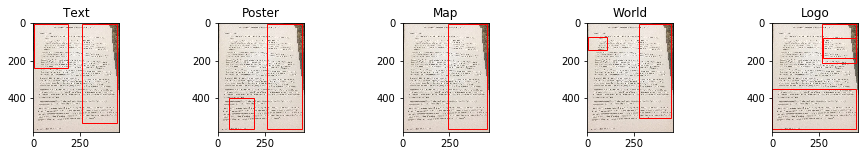

IC00120FI.jpg.ldcc


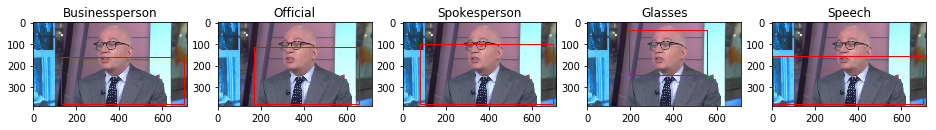

IC0011Y40.jpg.ldcc


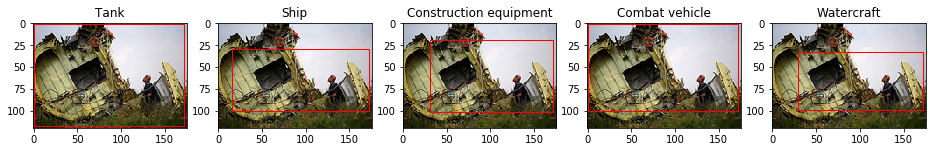

HC000SP61.jpg.ldcc


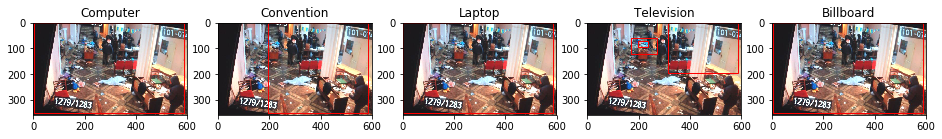

IC0011UNQ.jpg.ldcc


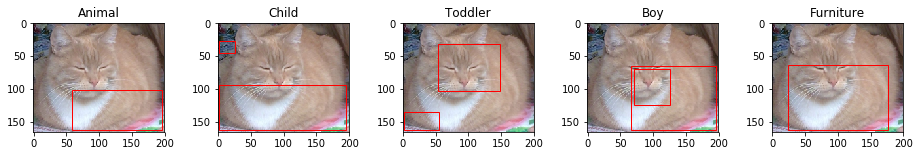

IC00120L0.jpg.ldcc


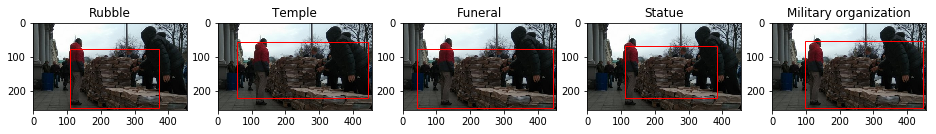

IC0011Z0Q.jpg.ldcc


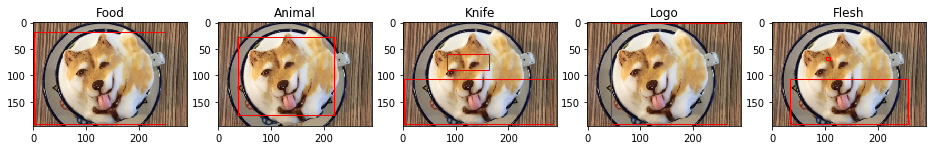

HC000SPMO.jpg.ldcc


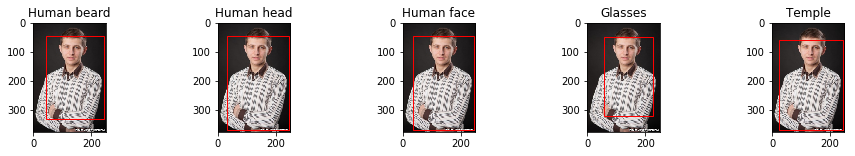

IC0011WQX.jpg.ldcc


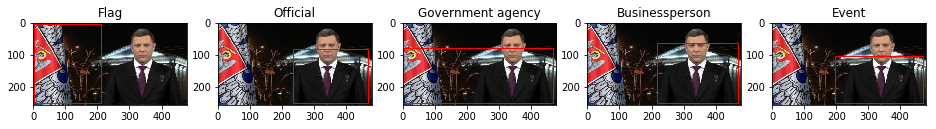

IC0011X0W.jpg.ldcc


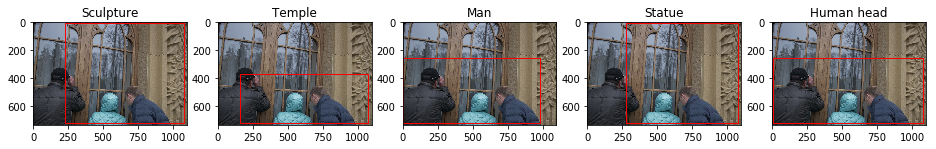

IC0011WPQ.jpg.ldcc


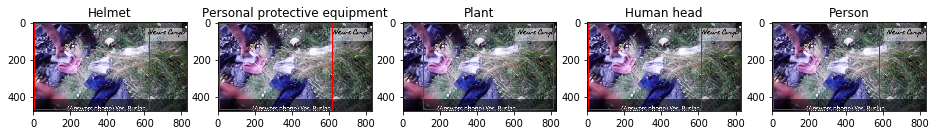

In [26]:
topk_vis = 5
for _ in range(50):
    filename = np.random.choice(test_img_filenames)
    imgid = filename.split('/')[-1]
    print(imgid)
    with open(filename, 'rb') as fin:
        _ = fin.read(1024)
        imgbin = fin.read()
    imgbgr = cv2.imdecode(np.fromstring(imgbin, dtype='uint8'), cv2.IMREAD_COLOR)
    imgrgb = imgbgr[:,:,[2,1,0]]        
    height, width, _ = imgrgb.shape

    #print([mid2name[item['label']] for item in annot[imgid]]) 
    
    fig, axes = plt.subplots(1, topk_vis, figsize=(16, 2))        
    
    for ii in range(topk_vis):
        axes[ii].imshow(imgrgb)
        axes[ii].set_title(mid2name[all_labels[det_results[imgid]['sorted_labels'][ii]]])
        for box in det_results[imgid]['sorted_bboxes'][ii][1::2]:
            axes[ii].add_patch(patches.Rectangle(
                (box[0]*width, box[1]*height), (box[2]-box[0])*width, (box[3]-box[1])*height,
                linewidth=1, edgecolor='r', facecolor='none'
            ))
            
    plt.show()

HC00000HK.jpg.ldcc


/home/alireza/home_at_filer2/tools/anaconda3/envs/py3torch/lib/python3.6/site-packages/ipykernel/__main__.py:9: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


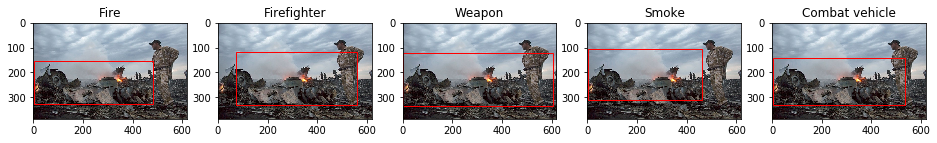

IC0011UPT.jpg.ldcc


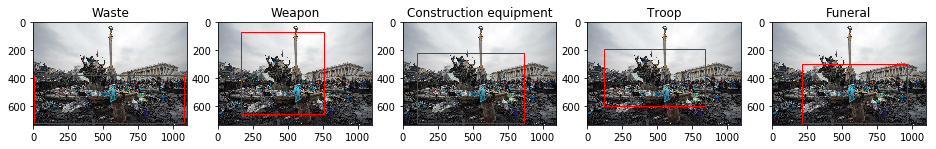

IC0011UEY.jpg.ldcc


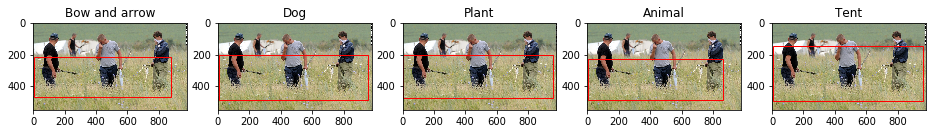

IC00150I1.jpg.ldcc


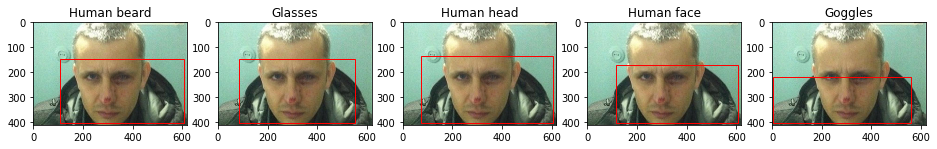

HC00025G3.jpg.ldcc


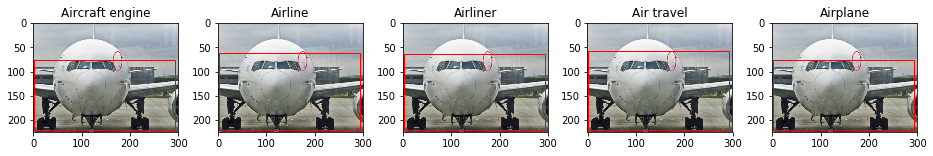

IC001202Q.jpg.ldcc


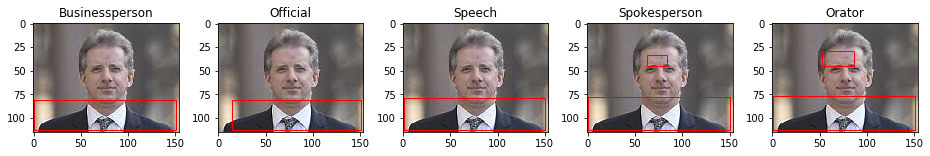

IC0011XSC.jpg.ldcc


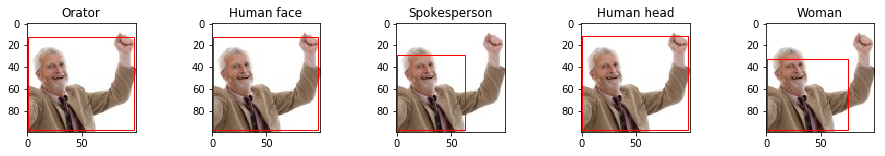

IC0011U5H.jpg.ldcc


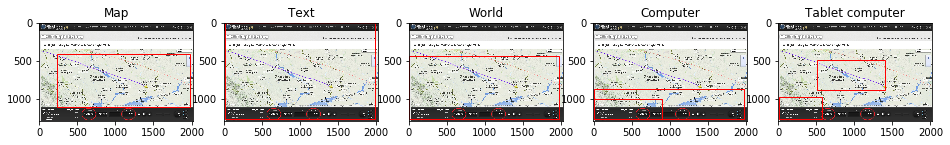

IC0011W1G.jpg.ldcc


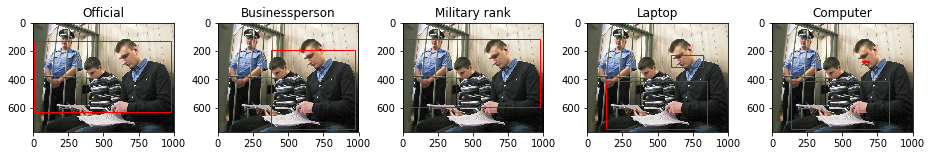

IC0011T76.jpg.ldcc


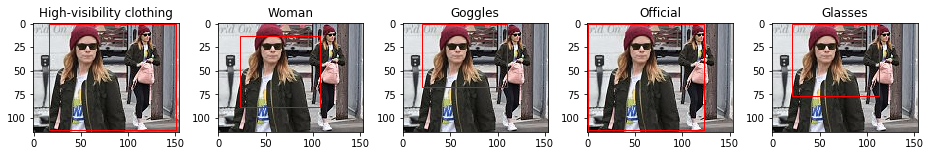

IC0011UEY.jpg.ldcc


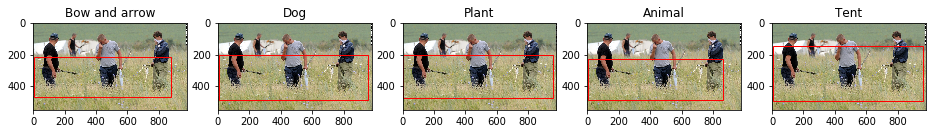

IC0011TNH.jpg.ldcc


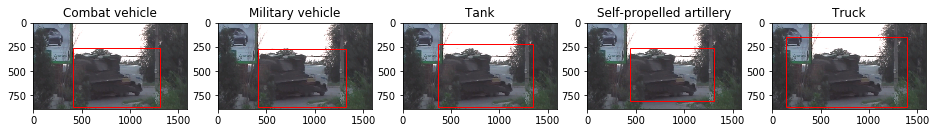

IC0011VCJ.jpg.ldcc


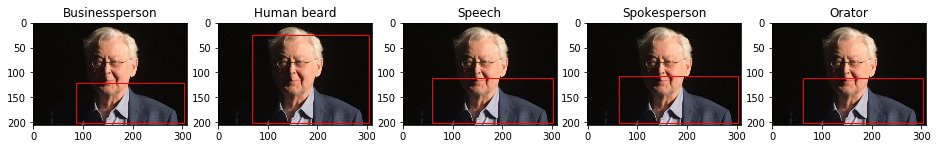

IC0011XNJ.jpg.ldcc


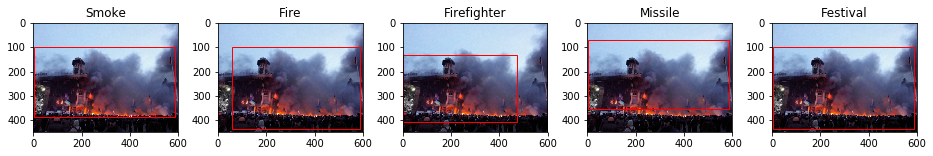

IC0011XZ1.jpg.ldcc


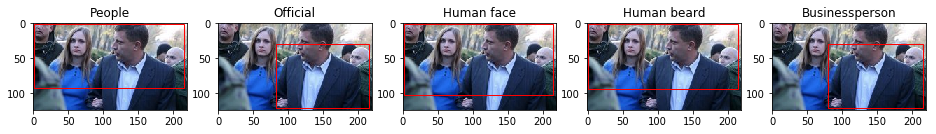

IC0011VOT.jpg.ldcc


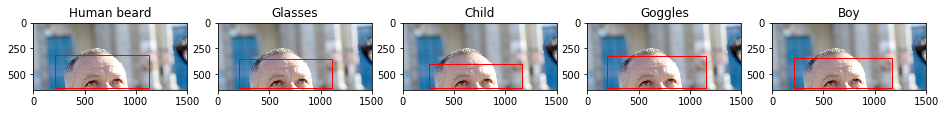

IC0011WGQ.jpg.ldcc


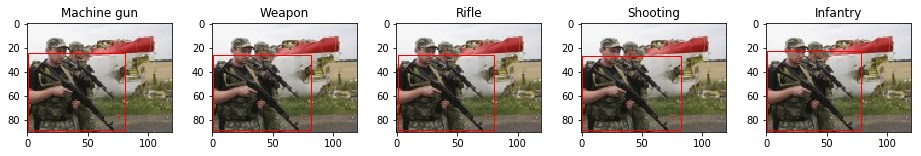

HC000SSQP.jpg.ldcc


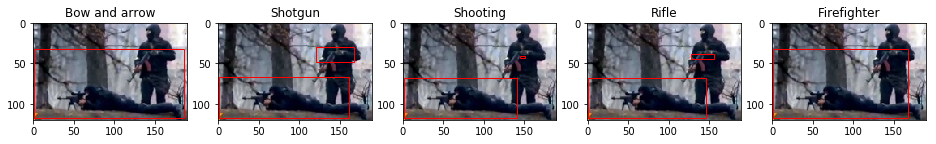

IC0011T2A.jpg.ldcc


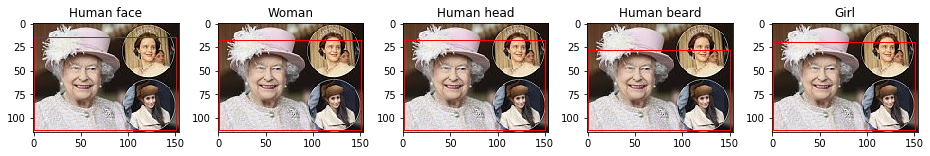

HC000SS1L.jpg.ldcc


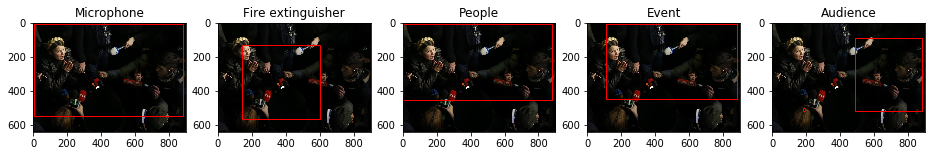

HC000SPN3.jpg.ldcc


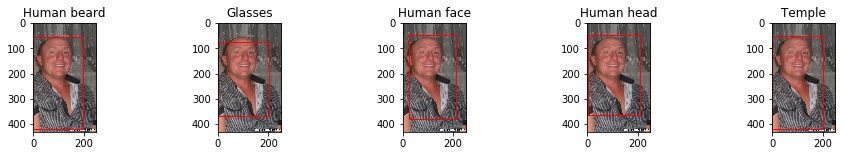

HC00000QT.jpg.ldcc


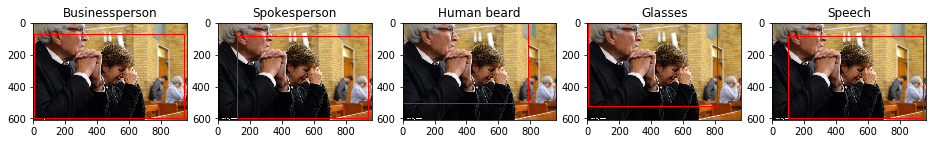

IC0011T56.jpg.ldcc


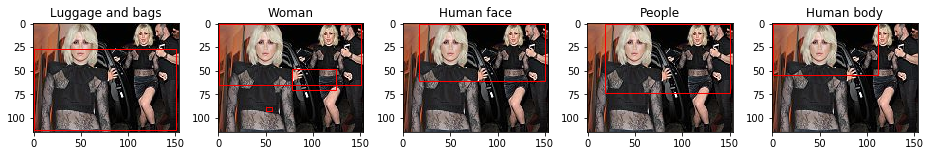

IC00158AR.jpg.ldcc


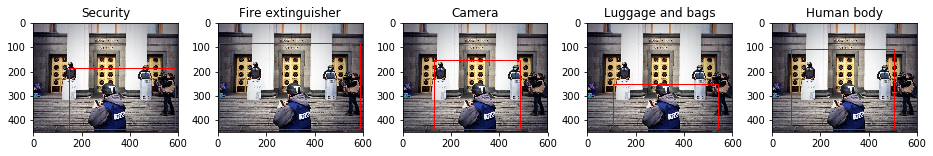

IC0011V31.jpg.ldcc


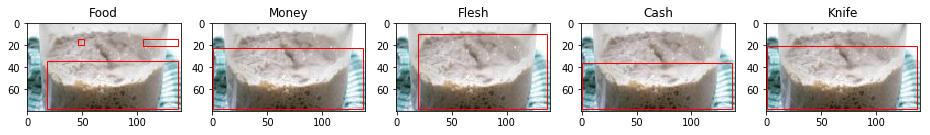

HC00000LQ.jpg.ldcc


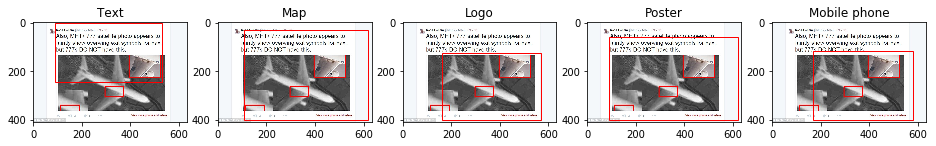

IC0011UED.jpg.ldcc


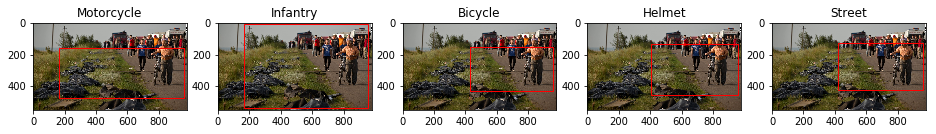

IC0011VW0.jpg.ldcc


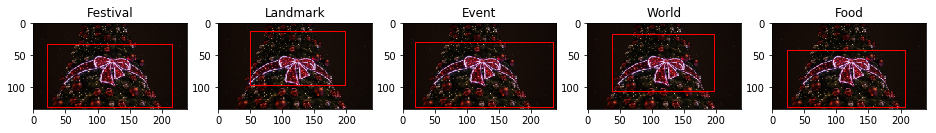

HC000ZIZK.jpg.ldcc


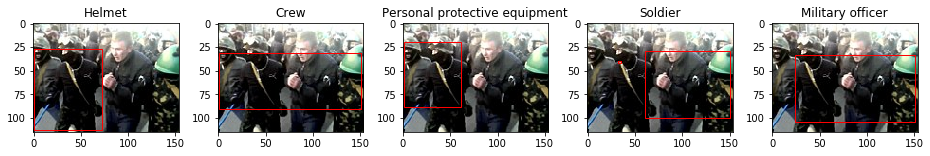

HC00025FS.jpg.ldcc


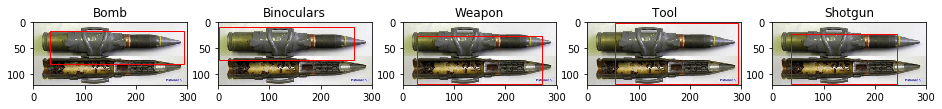

IC00120V2.jpg.ldcc


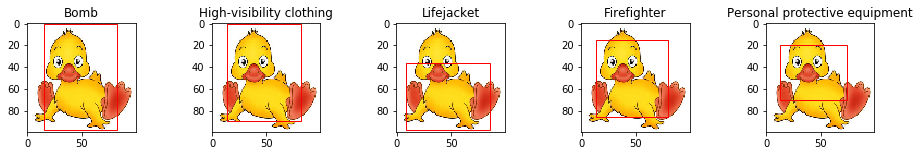

IC0011UE8.jpg.ldcc


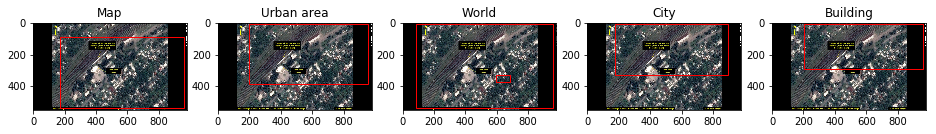

IC0015BFG.jpg.ldcc


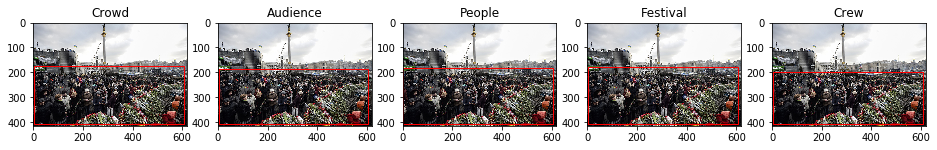

HC000ZIZO.jpg.ldcc


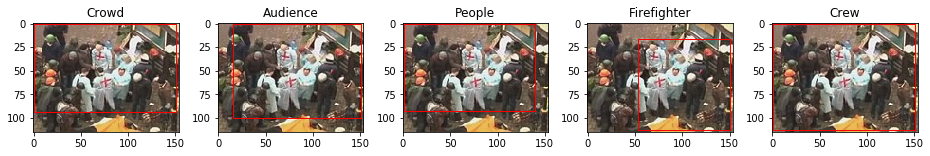

IC0012186.jpg.ldcc


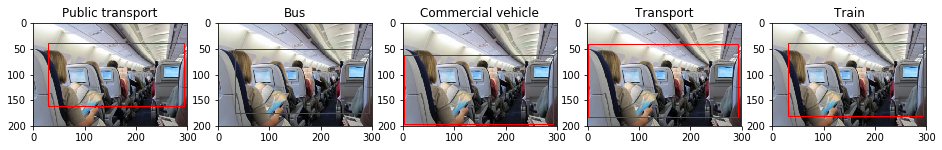

HC00025FT.jpg.ldcc


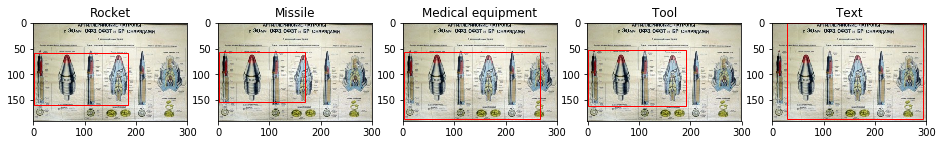

IC0011XID.jpg.ldcc


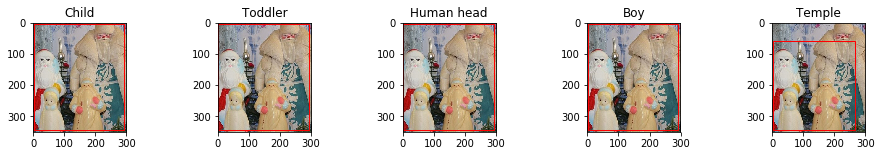

IC0011T2Q.jpg.ldcc


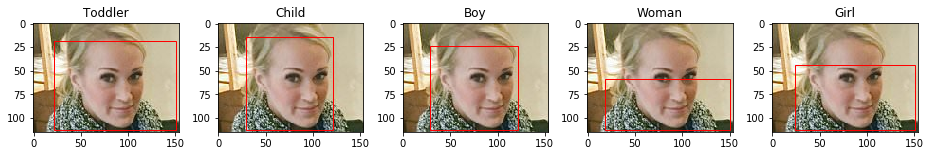

IC00120I9.jpg.ldcc


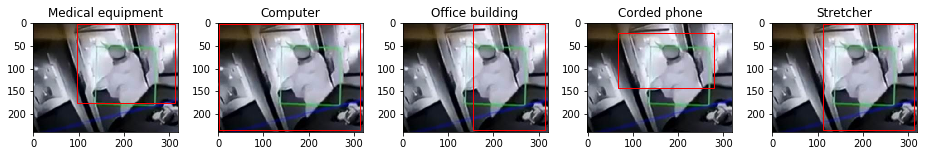

IC0011T55.jpg.ldcc


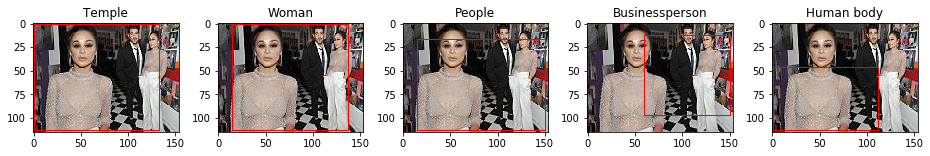

IC0011UGY.jpg.ldcc


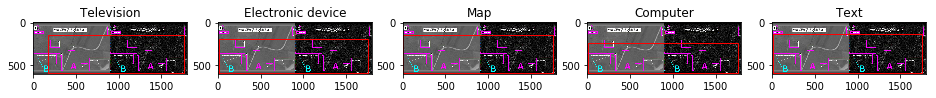

IC0011SXN.jpg.ldcc


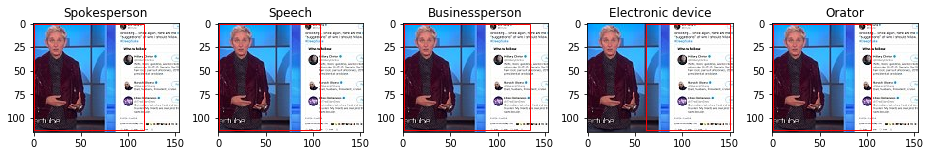

IC0011XLC.jpg.ldcc


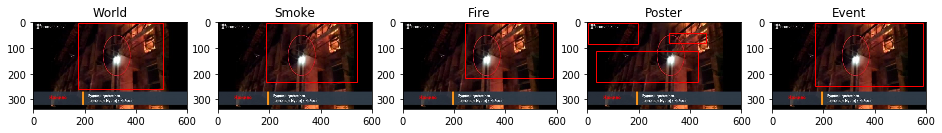

IC0011XUF.jpg.ldcc


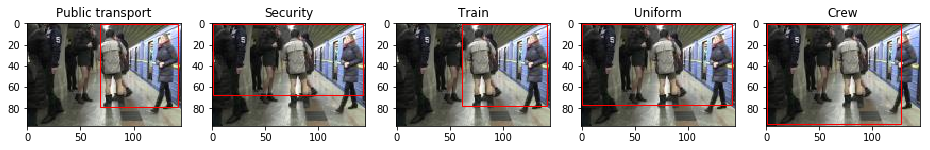

IC0011V01.jpg.ldcc


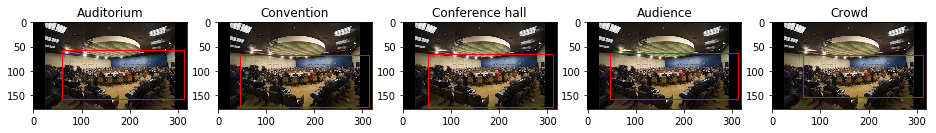

IC0011V7W.jpg.ldcc


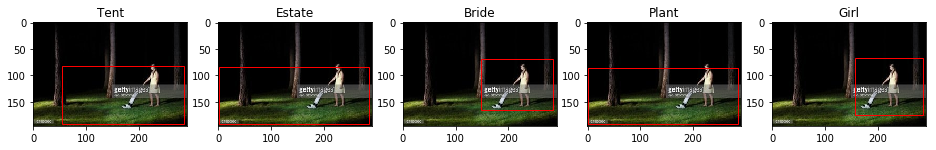

IC00158A5.jpg.ldcc


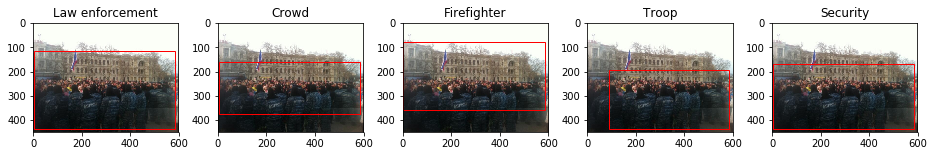

HC000ZIY3.jpg.ldcc


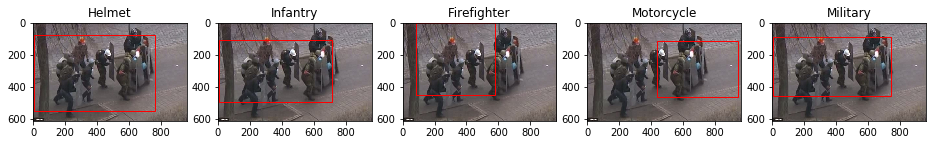

HC000SSXI.jpg.ldcc


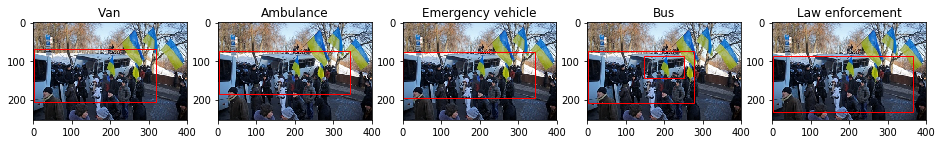

IC0011Z0D.jpg.ldcc


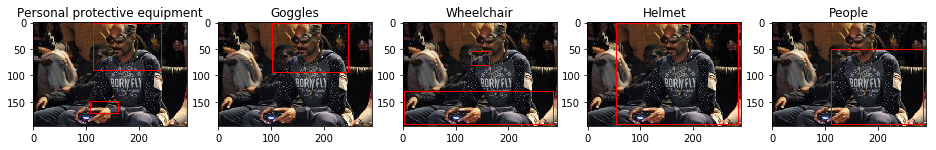

In [27]:
topk_vis = 5
for _ in range(50):
    filename = np.random.choice(test_img_filenames)
    imgid = filename.split('/')[-1]
    print(imgid)
    with open(filename, 'rb') as fin:
        _ = fin.read(1024)
        imgbin = fin.read()
    imgbgr = cv2.imdecode(np.fromstring(imgbin, dtype='uint8'), cv2.IMREAD_COLOR)
    imgrgb = imgbgr[:,:,[2,1,0]]        
    height, width, _ = imgrgb.shape

    #print([mid2name[item['label']] for item in annot[imgid]]) 
    
    fig, axes = plt.subplots(1, topk_vis, figsize=(16, 2))        
    
    for ii in range(topk_vis):
        axes[ii].imshow(imgrgb)
        axes[ii].set_title(mid2name[all_labels[det_results[imgid]['sorted_labels'][ii]]])
        for box in det_results[imgid]['sorted_bboxes'][ii][1::2]:
            axes[ii].add_patch(patches.Rectangle(
                (box[0]*width, box[1]*height), (box[2]-box[0])*width, (box[3]-box[1])*height,
                linewidth=1, edgecolor='r', facecolor='none'
            ))
            
    plt.show()

HC000ZK8H.jpg.ldcc


/home/alireza/home_at_filer2/tools/anaconda3/envs/py3torch/lib/python3.6/site-packages/ipykernel/__main__.py:9: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


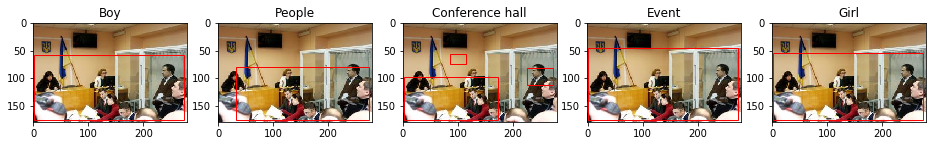

IC0011W01.jpg.ldcc


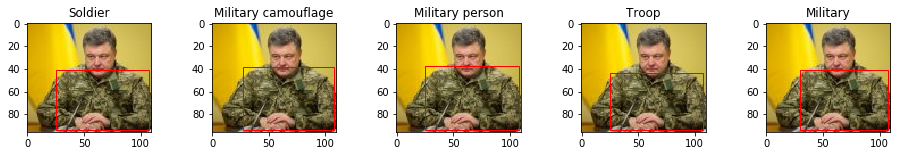

IC0011V6B.jpg.ldcc


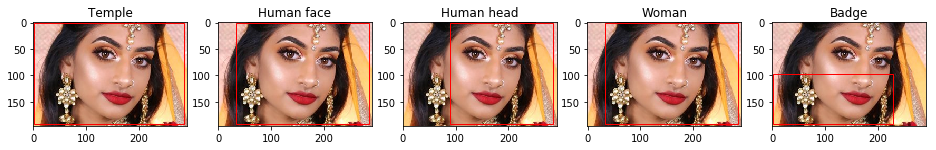

HC000SP93.jpg.ldcc


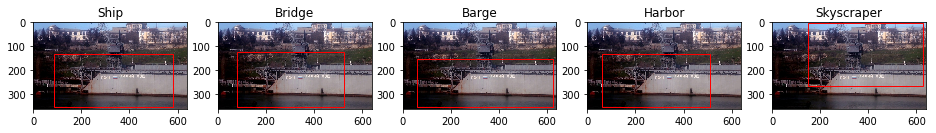

IC0011UNN.jpg.ldcc


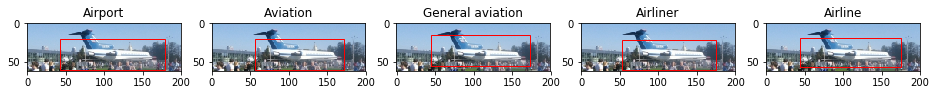

IC0011WFT.jpg.ldcc


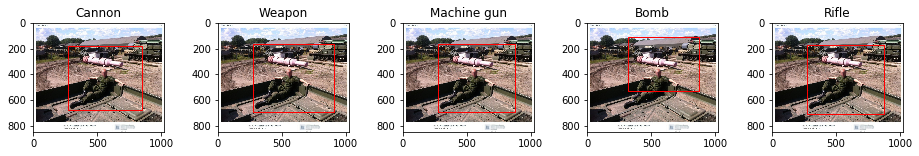

IC0011T8U.jpg.ldcc


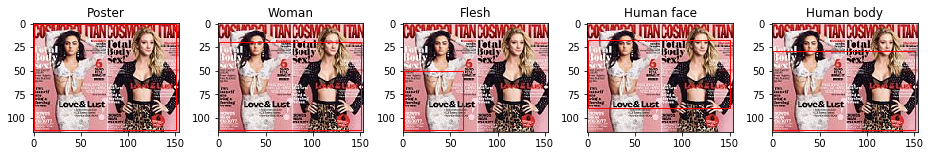

IC0011UGE.jpg.ldcc


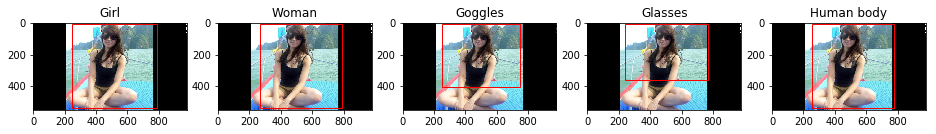

IC0011UGZ.jpg.ldcc


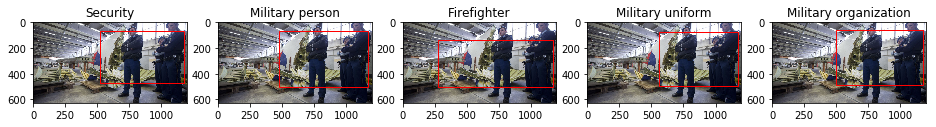

IC00158AO.jpg.ldcc


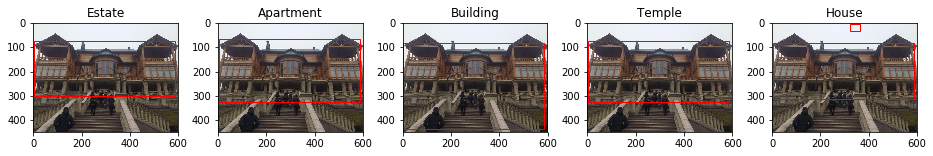

IC0011YOC.jpg.ldcc


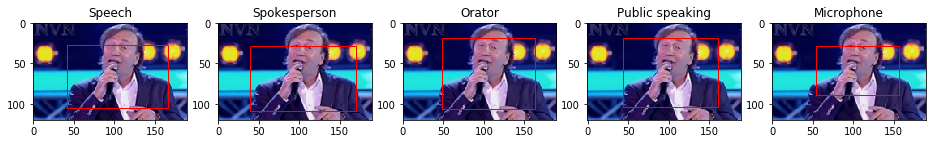

IC0011TNI.jpg.ldcc


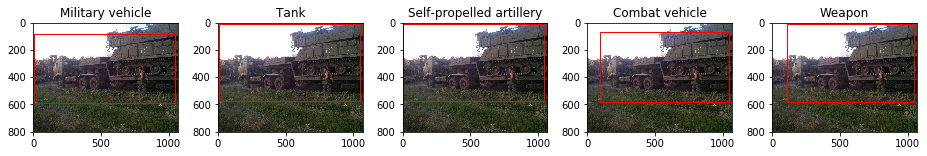

HC000SP4G.jpg.ldcc


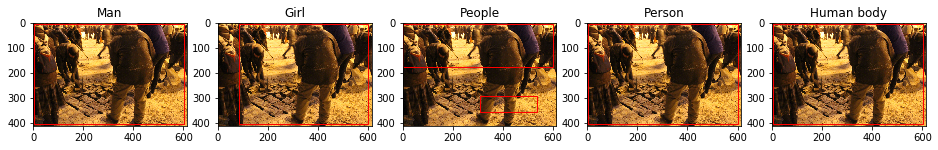

IC0011VAS.jpg.ldcc


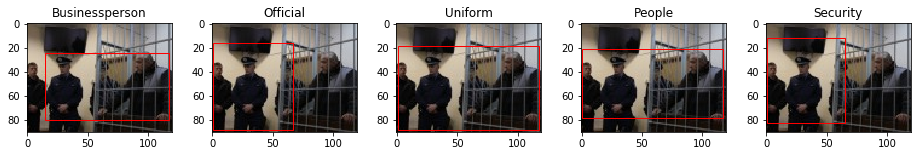

IC0011T4N.jpg.ldcc


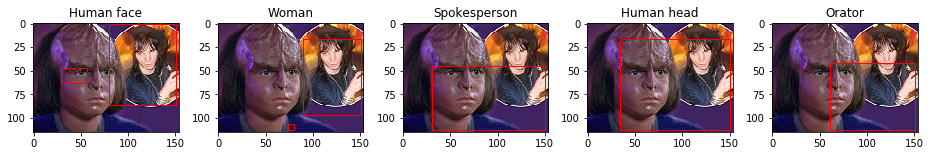

HC000ST2Y.jpg.ldcc


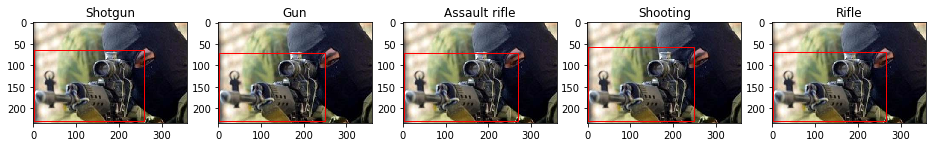

IC0011T7I.jpg.ldcc


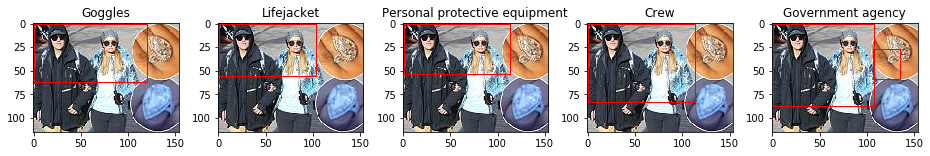

IC0011XMZ.jpg.ldcc


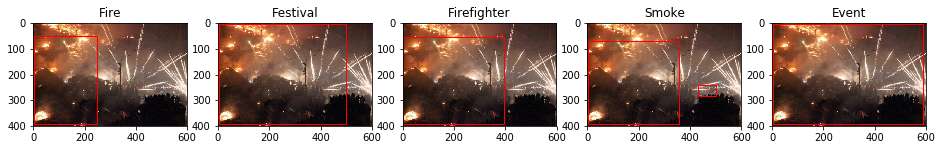

HC000SNQE.jpg.ldcc


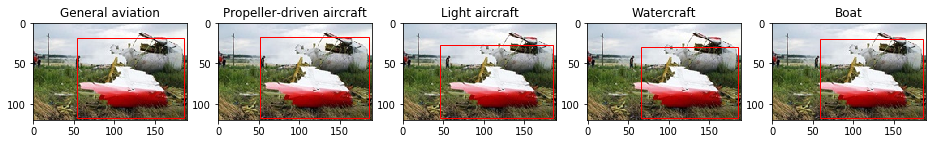

IC0011T11.jpg.ldcc


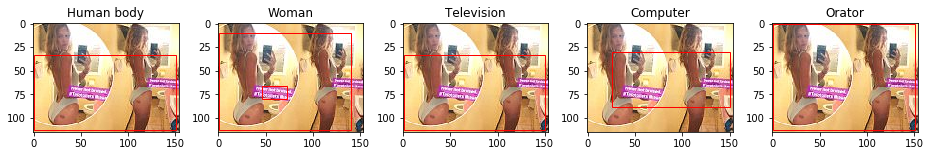

IC0011VAX.jpg.ldcc


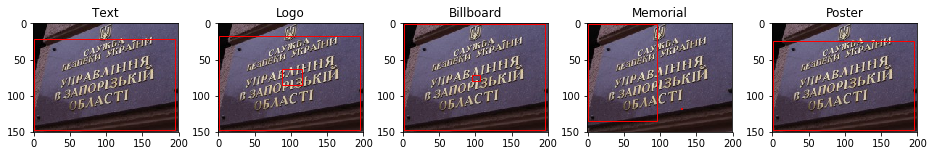

IC001203U.jpg.ldcc


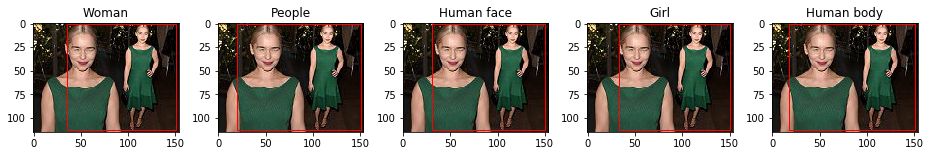

IC0011U57.jpg.ldcc


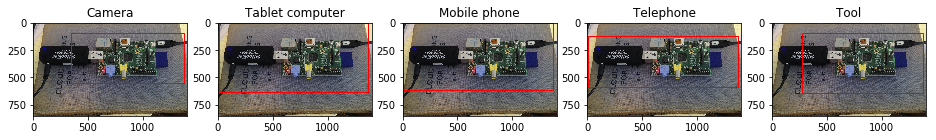

IC0011XGV.jpg.ldcc


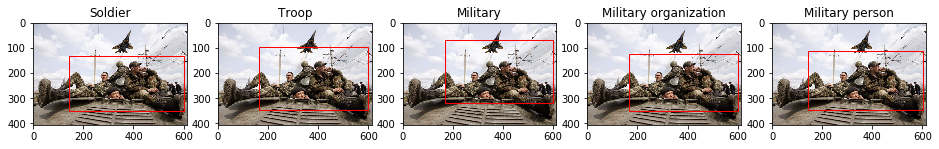

HC000SP3H.jpg.ldcc


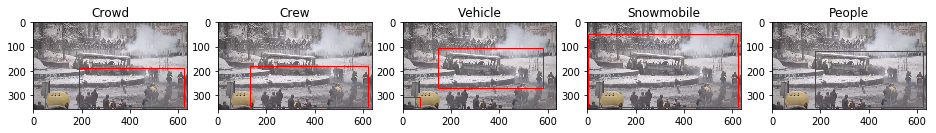

HC000ZJII.jpg.ldcc


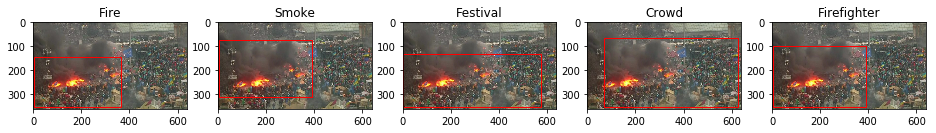

IC0011T87.jpg.ldcc


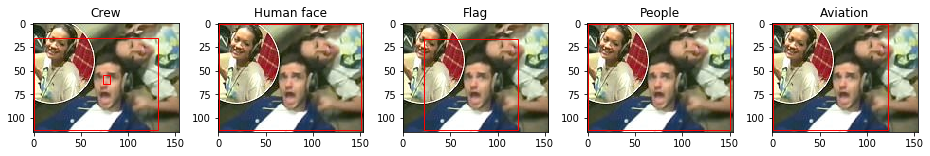

IC0011WMY.jpg.ldcc


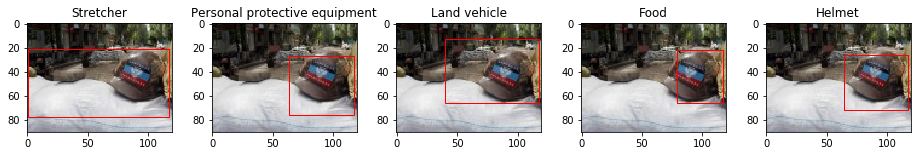

IC0011UNJ.jpg.ldcc


TypeError: 'NoneType' object is not subscriptable

In [28]:
topk_vis = 5
for _ in range(50):
    filename = np.random.choice(test_img_filenames)
    imgid = filename.split('/')[-1]
    print(imgid)
    with open(filename, 'rb') as fin:
        _ = fin.read(1024)
        imgbin = fin.read()
    imgbgr = cv2.imdecode(np.fromstring(imgbin, dtype='uint8'), cv2.IMREAD_COLOR)
    imgrgb = imgbgr[:,:,[2,1,0]]        
    height, width, _ = imgrgb.shape

    #print([mid2name[item['label']] for item in annot[imgid]]) 
    
    fig, axes = plt.subplots(1, topk_vis, figsize=(16, 2))        
    
    for ii in range(topk_vis):
        axes[ii].imshow(imgrgb)
        axes[ii].set_title(mid2name[all_labels[det_results[imgid]['sorted_labels'][ii]]])
        for box in det_results[imgid]['sorted_bboxes'][ii][1::2]:
            axes[ii].add_patch(patches.Rectangle(
                (box[0]*width, box[1]*height), (box[2]-box[0])*width, (box[3]-box[1])*height,
                linewidth=1, edgecolor='r', facecolor='none'
            ))
            
    plt.show()